# Team ID : PTID-CDS-JAN-23-1445
# Project ID : PRCP-1004-FIFA 20

## WELCOME TO FIFA 20 ANALYSIS

![Fifa](https://media.contentapi.ea.com/content/dam/ea/fifa/fifa-20/global-assets/common/fifa20-grid-tile-requirements-16x9.png.adapt.crop191x100.1200w.png)

FIFA 20 is one of the best games over the past 20 years and very popular all over the world.
FIFA is a game released annually by Electronic Arts under the EA Sports label. As of 2011, the FIFA franchise has been localised into 18 languages and available in 51 countries. Listed in Guinness World Records as the best-selling sports video game franchise in the world, by 2019, the FIFA series had sold over 282.4 million copies. It is also one of the best-selling video game franchises. 

FIFA was founded in 1904 to oversee international competition among the national associations of Belgium, Denmark, France, Germany, the Netherlands, Spain, Sweden, and Switzerland. Headquartered in Zürich, its membership is now comprises 211 national associations.Also by finding some players information like nationality, overall score, potential we could predict the best player in future. In this report we didn’t predict the best player but the insights found from this analysis could be useful.

In this report we clean and inspect the data first and some findings like how many different nationality players have, how many different clubs are there in FIFA 2020. We also find some insights about players like player's BMI, player's under 20 having the highest score, player with the highest potential but lowest overall score and so on. This report presents some insights about FIFA 2020 video game.


### **Brief description of the dataset:**
- Every player available in FIFA 20 has 100+ attributes
- URL of the scraped player
- Player positions, with the role in the club and in the national team
- Player attributes with statistics as Attacking, Skills, Defense, Mentality, GK Skills, etc.
- Player personal data like Nationality, Club, DateOfBirth, Wage, Salary, etc.

![FIFA](https://cdn.vox-cdn.com/thumbor/lTP0_tHaDU3IC0YXPdqzFTzZ97s=/0x150:7680x4171/fit-in/1200x630/cdn.vox-cdn.com/uploads/chorus_asset/file/12785703/FIFA19_ActiveTouch_Gen4.jpg)


**Problem Statement/Tasks:**
* Task 1:-Prepare a complete data analysis report on the given data.
* Task 2:- Explore football skills and cluster football players based on their attributes.
* Task3:- Explore the data and attempt all the below asked questions in a
step by step manner:<br>
     ● Prepare a rank ordered list of top 10 countries with most players. Which countries are producing the most footballers that play at this level?<br>
     ● Plot the distribution of overall rating vs. age of players. Interpret what is the age after which a player stops improving?<br>
     ● Which type of offensive players tends to get paid the most: the striker, the right-winger, or the left-winger? 


## Import all the necessary Libraries

In [1]:
#------------Basic Libraies------------------
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt, seaborn as sns
import plotly.express as px
sns.set()
#pd.set_option("display.max_columns", None)
pd.set_option("display.max_rows", None)
import warnings
warnings.filterwarnings('ignore')

## Importing & Converting the dataset into pandas DataFrame

In [2]:
df = pd.read_csv("players_20.csv")

__Columns of the Dataset__

In [3]:
df.columns

Index(['sofifa_id', 'player_url', 'short_name', 'long_name', 'age', 'dob',
       'height_cm', 'weight_kg', 'nationality', 'club',
       ...
       'lwb', 'ldm', 'cdm', 'rdm', 'rwb', 'lb', 'lcb', 'cb', 'rcb', 'rb'],
      dtype='object', length=104)

### Domain Analysis
1. **sofifa_id:**Sofifa is the acronym for Soccer Football FIFA. It is a website that provides information on football (soccer) players and teams, including player stats, transfer news, and more.
and the term "Sofifa ID" refers to a unique identifier assigned to each player and teams in the video game FIFA. The identifier is used in the game to track and identify individual players, allowing users to search and compare statistics, ratings, and other information about different players. The Sofifa ID is typically a numerical value, which can be used to search for the player on websites like sofifa.com, which provides information and updates on player statistics and ratings in FIFA games.

2. **player_url:** The player URL in FIFA refers to the specific web page or online profile of a player on the FIFA website. It typically includes the player's name, statistics, profile picture, and other information about their career and performance in FIFA games. To find the player URL in FIFA, you can search for the player's name on the FIFA website or navigate to their profile through the game menus. The URL will typically be in the format "https://sofifa.com/players/[player-id]".

3. **short_name:** In the FIFA dataset, the short name refers to an abbreviated version of a player's name. It is commonly used in the gaming industry to reduce the length of the player's name in order to display it on the screen.

4. **long_name:** The long name in the FIFA dataset refers to the full name of a player, which includes their first name, middle name (if applicable), and last name combined.

5. **age:** It refers to the player's current age or the age at the time the data was recorded. It is usually represented as a numerical value, such as 25 or 32 years old.

6. **dob:** It stands for Date of Birth and refers to the date when a player was born.

7. **height_cm:** It refers to the height of the player in centimeters. This is typically used to indicate the physical attributes of a player, which can affect their performance on the field.

8. **weight_kg:**It refers to the weight of a player in kilograms. This is another physical attribute that is considered when evaluating a player's performance on the field. A player's weight can also impact their speed and agility, as well as their endurance.

9. **nationality:** It refers to the country a player is associated with in terms of their citizenship. This information is used to determine which national team a player is eligible to represent on the international level. This can be a reflection of the player's country of origin, or it may indicate that they have obtained citizenship in another country. It helps identify players from different countries as well as to provide context on their background and cultural heritage.

10. **club:** The club field refers to the current team or club that a player is playing for. This can be a professional club in a league such as the English Premier League, La Liga, Serie A, etc. or a national team. The club information can be used to track the transfer of players between teams and to analyze the performance of teams in different leagues.

11. **overall:** It is a rating or score given to a player that represents their overall ability and potential. This rating is determined by taking into account various factors such as the player's skills, attributes, and performance history such as pace, shooting, passing, dribbling, defending,technical skills and physical attributes. It is considered one of the most important metrics typically used as a quick reference to assess a player's potential and ability, and is also used to compare players with each other and can help in choosing the right player for a team or in evaluating the strength of a team overall. 

12. **value_eur:** It refers to the estimated market value of a player in European currency (Euros). This value is typically calculated based on the player's current ability, performance history, potential, age, and other factors that can impact their worth as a professional footballer. It is used to help determine recent transfer fees and contracts, and can be used to compare the value of different players in the game. It can sometimes be a compensation that a team might pay to acquire a player, and can also reflect the player's popularity and demand in the market.

13. **potential:** It is a rating that represents a player's future potential and development. It takes into account the player's current abilities, age, and potential growth. The potential rating ranges from 0 to 99, with a higher number indicating a higher potential for improvement. It is determined by a number of factors, such as training, matches, and in-game decisions including their current attributes, current performance, and future potential.<br>
Younger players generally have a higher potential, as they have more time to develop and grow as a player. However, older players can also have high potential if they are talented and have the ability to continue to improve. The potential stat is an important consideration for managers and scouts, as it can indicate a player's long-term value and potential impact on a team, as well as in building a successful team for the future.. It also determines a player's market value and transfer fees, as well as their ability to improve and reach their full potential over time. However, it's important to note that potential is not a guarantee of success and many other factors, such as form, injury, and player development, can impact a player's progression.<br>

14. **wage_eur:** It refers to the salary a player is earning in Euros.This information is important for clubs and teams to understand the financial aspects of a player's career over time as a result of new contracts or negotiations and can also help clubs and teams determine the cost of signing or retaining a player. This amount can vary greatly depending on the player's abilities, contract length, and performance history.<br>

15. **player_positions:** This field refers to the positions that a player is capable of playing in the field. This can include specific positions such as striker, midfielder, defender, or goalkeeper, as well as more general positions such as attacking midfield or center back. This information is used to determine the player's strengths and weaknesses, versatility and the various roles they can play within a team in each position to determine their overall rating. A player may have one primary position they play in, but they may also be capable of playing in other positions as needed. Knowing a player's positions can also help teams determine their best fit on the field and make tactical decisions.<br>

16. **preferred_foot:** It refers to the dominant foot of a player, which is used more frequently when controlling and shooting the ball. It can impact their ability to perform certain actions on the pitch, such as shooting, passing, dribbling, and other actions that require a degree of precision or accuracy. One can can select either "left" or "right" to represent the player's preferred foot. Some players may be ambidextrous("neutral"), in this case the game assigns them a preferred foot based on their in-game statistics and performance. The preferred foot is used to determine the direction that a player will lean when shooting or dribbling, as well as to influence the accuracy and power of certain moves. In general, players who have their preferred foot as their strong foot will be able to perform actions more effectively with that foot, but may be less effective with their weak foot. The preferred foot information can be viewed in the player's profile and is usually listed along with other attributes such as height, weight, and position. However, it's important to note that a player's preferred foot can also be changed during gameplay.<br>

17. **international_reputation:** It is a Stat that represents the player's reputation, recognition and status in the soccer community on a global scale. It is based on their real-life performances and accomplishments and can have an impact on the player's market value and transfer fees. A player with a higher international reputation will be more valuable in the transfer market and is likely to attract interest from big clubs.<br>
The international reputation stat ranges from 1 to 5 stars, with 5 stars representing the highest level of international recognition. This stat can be increased or decreased based on the player's real-life performances and milestones, such as winning major tournaments, being awarded individual awards, being named to all-star teams, contract offers, and loan proposal and earning call-ups to the national team.<br>
Having a higher international reputation can also impact the player's overall rating and transfer value in the game and can influence the outcome of certain scenarios, such as contract negotiations, transfer bids, join high-profile clubs and compete in international competitions.<br>

18. **weak_foot:** It refers to a player's non-dominant foot or not their preferred foot. The weak foot rating can be viewed in the player's profile and is usually listed along with other attributes such as height, weight, and position. The weak foot rating ranges from 1 to 5 stars, with 5 stars being the highest possible rating.<br>
Having a high weak foot rating can be an advantage as it indicates that a player is equally proficient with both feet and is comfortable and effective using their non-dominant foot when shooting, passing, and dribbling It means with a higher rating indicating better proficiency making them more versatile and unpredictable on the pitch, allowing them to create and score goals from a wider range of positions, can play on both wings or as a central midfielder, giving their team more flexibility in their tactics and formations.<br>
On the other hand, a player with a low weak foot rating will struggle when using their non-dominant foot, which can impact their overall performance and effectiveness on the pitch. Knowing a player's weak foot can be useful for managers and coaches when developing player tactics and game plans, as well as for players when deciding which foot to use during a match.<br>

19. **skill_moves:** Skill moves refer to the various special dribbling techniques that a player can perform to get past defenders and create scoring opportunities to beat an opponent. These can include moves such as stepovers, feints, and ball tricks. There are a variety of skill moves that can be executed in FIFA, ranging from basic dribbling moves to more complex feints and stepovers. Some of the most popular skill moves in FIFA include:<br>
* __Ball Roll (R1/RB + Right Stick)__ * <br>
* __Marseille Turn (R1/RB + Circle/B)__ *<br>
* __Fake Shot (Square/X)__ *<br>
* __Hocus Pocus (L1/LB + Right Stick)__ *<br>
* __Roulette (R1/RB + Circle/B)__ *<br>
* __Flip Flap (R1/RB + X/A)__ *<br>
* __Body Feint (Right Stick)__ *<br>
* __Ball Juggle (Circle/B)__ *<br>

20. **work_rate:** It refers to the amount of effort a player expends during a match. It is a measure of a player's physical and mental activity level and can have a significant impact on their performance on the field. In FIFA, work rates are typically described using two terms, one for attacking work rate and one for defensive work rate, with each term represented by one of three possible values: low, medium, or high. 
__There are two aspects of work rate in FIFA:__
* __attacking work rate:__ * Attacking work rate refers to the amount of effort a player puts into attacking play when his team has possession of the ball. High attacking work rate players tend to push forward and make runs into the opponent's half, looking for opportunities to create goalscoring chances.
* __defensive work rate:__ * Defensive work rate refers to the amount of effort a player puts into defensive play when his team doesn't have possession of the ball. High defensive work rate players tend to track back and help out their defense, looking to win the ball back and prevent the opposition from creating goalscoring opportunities.<br>
These values are combined to create a range of possible work rate combinations, including:<br> 
    * __Medium/Low (M/L):__ The player will tend to move forward to participate in the attack, but will not track back as often to defend. 
    * __High/Low (H/L):__ The player will frequently move forward to participate in the attack, but will not defend as often. 
    * __High/Medium (H/M):__ The player will frequently move forward to participate in the attack, and will also track back to defend when needed. 
    * __Medium/Medium (M/M):__ The player will tend to move forward to participate in the attack, and will also track back to defend, but not as frequently as a player with high work rates. 
    * __High/High (H/H):__ The player will frequently move forward to participate in the attack, and will frequently track back to defend. 
    * __Medium/High (M/H):__ The player will tend to move forward to participate in the attack, and will frequently track back to defend. 
    * __Low/High (L/H):__ The player will rarely move forward to participate in the attack, but will frequently track back to defend.
    * __Low/Medium (L/M):__ The player will rarely move forward to participate in the attack, and will only track back to defend when needed. 
    * __Low/Low (L/L):__ The player will rarely move forward to participate in the attack, and will not track back to defend as often.<br>
Work rate can have a significant impact on a player's performance in FIFA and it is an important factor to consider when building a team or selecting individual players. "High work" rate players are often able to cover more ground and be more involved in the game, while "low work" rate players may be more focused on conserving energy, but may also lead to a reduction in their impact on the game. The ideal work rate for a player will depend on their position, role, and individual style of play.

21. **body_type:** It refers to the physical build and stature of a player. It can have a significant impact on a player's physical attributes and overall performance, such as their acceleration, speed, strength and agility.<br>
In FIFA, body type is often categorized into several types, including:<br>
* __Lean:__ * Players with a lean body type are generally quicker and more agile, but may lack strength and power.

* __Normal:__ * Players with a normal body type have a balanced combination of speed, strength, and agility.

* __Stocky:__ * Players with a stocky body type are generally stronger and more powerful, but may lack speed and agility.

* __Mixed:__ * Players with a mixed body type have a combination of characteristics from different body types.

* __Large:__ * Players with a large body type tend to be stronger and more physically imposing, but they may not be as quick or agile as players with a smaller body type.

* __Small:__ *  Players with a small body type tend to be quick and agile, but they may not have as much strength or physical presence as players with a larger body type.<br>
It is important to note that each body type has its own advantages and disadvantages, and choosing the player's right body type can be an important factor in specific situations, such as winning aerial battles or defending against powerful opponents when building a team and making tactical decisions, as different body types can offer unique strengths and weakness. But a player's body type is only one aspect of their overall attributes and should not be the only factor considered.

22. **real_face:** In the FIFA video game series, player faces are designed to closely resemble the real-life appearance of professional footballers. The game developers use a combination of 3D modeling and texture mapping techniques to create player faces that are as accurate as possible. Having real faces for players in FIFA adds to the game's realism, allowing fans to easily recognize their favorite players and feel more connected to the virtual football world. It also helps to create a more immersive experience, making it feel as if you are watching a real-life football match.It's worth noting that while many player faces in FIFA are realistic, not all players have their faces scanned and modeled in the game. This can be due to a variety of reasons, such as lack of permission from the player, or the player's agent, or simply a decision by the developers to prioritize other features. In these cases, players may have generic or customized faces in the game instead.

23. **release_clause_eur:** A release clause is a clause in a player's contract that allows the player to leave the club for a specified fee, known as the release clause amount(in euros). This amount is set in the player's contract and is often used as a means of protecting the club's investment in the player.It represents the amount of money that a club would have to pay in order to buy a player out of their contract and secure their transfer. It's important to note that release clauses are not always included in every player's contract in FIFA, and they are typically only used for high-value players who are considered to be in demand by other teams.In FIFA, the release clause amount is one of several attributes that determine a player's overall transfer value and can be an important factor in transfer negotiations between clubs. However, it's important to note that the release clause amounts in FIFA is purely for gameplay purposes and are not always an accurate reflection of real-life release clauses and are often fictional or exaggerated for the purpose of the game.

24. **player_tags:** In the FIFA video game series, player tags are labels that are applied to players to help highlight their key attributes and playing styles. These tags are designed to provide a quick and easy way for players to understand the strengths and weaknesses of individual players and to help them make informed decisions when building their teams.<br>
Some examples of player tags in FIFA include:<br>
* __Speedster:__ * - These players are quick and agile, and excel at dribbling and running with the ball.<br>
* __Dribbler:__ * - Players with this tag are skilled at dribbling and can take on multiple defenders with ease.<br>
* __Playmaker:__ * - Playmakers are creative players who have the ability to create chances and set up goals for their teammates.<br>
* __Distance Shooter:__ * - These players have a powerful shot from distance and are capable of scoring from outside the box.<br>
* __Aerial Threat:__ * - Aerial threats are powerful players who excel in the air and are dangerous in the box on set pieces.<br>
* __Tackler:__ * - Tacklers are strong and physical players who are excellent at winning the ball back for their team.<br>
* __Technical Dribbler:__ * - Technical dribblers are highly skilled players who excel at close control and dribbling.<br>
* __Acrobat:__ * - players with excellent aerial ability and jumping reach.<br>
* __Clinical Finisher:__ * - players who are clinical and efficient in front of goal.<br>
* __Engine:__ * - players with high levels of energy and endurance, often playing in central midfield.<br>
* __Marksman:__ * - players with exceptional shooting accuracy and ability.<br>
* __Powerhouse:__ * - players with physicality and strength, often playing in central defense or midfield.<br>
* __Free-Kick Specialist:__ * - players with exceptional free-kick taking ability.<br>
Player tags in FIFA can be useful in helping players identify the key attributes of individual players and to make informed decisions when building their teams. However, it's important to remember that player tags are just one aspect of a player's overall attributes and should not be relied upon as the sole determinant of a player's ability.

25. **team_position:** It refers to team's ranking in a particular league, tournament, or competition.The position of a team is determined by a number of factors, such as the number of wins, draws, losses, goals scored, and goals conceded. The higher the number of wins, the higher the team's position in the league table. In international competitions, such as the World Cup, teams are ranked based on a combination of their win-loss record and goal difference. The top-ranked teams are typically considered to be the strongest, while the lower-ranked teams are considered to be weaker. It's important to note that a team's position can change from one match to the next based on the results of their games. 
1. **team_jersey_number:** In FIFA, team_jersey_number is typically the shirt number assigned to a player in the team he is playing for. This number is usually unique within the team, and it allows players to easily identify each other on the field. In some cases, certain numbers may be reserved for certain positions, such as the number 1 for goalkeepers, but this can vary from team to team.
1. **loaned_from:** The "loaned_from" in FIFA typically refers to the club that a player is currently on loan from. This can be relevant in the game, as some players may be loaned to different clubs for a certain period of time and can play for those clubs in the game.The "loaned_from" column can be used to track which team a player was originally signed to, separate from the team they are currently playing for.
1. **joined:** In FIFA, joined refers to the date that a player joined a club. In the FIFA franchise, players can change clubs through transfers, either permanently or on loan. It indicates the year or date that a player joined their specific club.
1. **contract_valid_until:** The "contract_valid_until" in FIFA refers to the date a player's contract with a club is valid until or expires. Players typically have contracts with their clubs that dictate the length of time they are under contract, and the "contract_valid_until" column could be used to track when a player's contract is set to expire.
1. **nation_position:** It refers to the preferred position of a player on their national team. Players can represent their national team in international tournaments, and the "nation_position" column could track the preferred position of a player on their national team.
1. **nation_jersey_number:** It refers to the shirt number a player wears for their national team. Players can have different shirt numbers for their club and national teams and the "nation_jersey_number" track the shirt number they wear for their country.

* __pace:__ This skill reflects a player's speed on the field, both with and without the ball. Players with high pace are typically able to outrun defenders and create scoring opportunities.

* __shooting:__ This skill reflects a player's accuracy and power when shooting the ball. Players with high shooting skills are able to score goals from difficult angles and distances.

* __passing:__ This skill reflects a player's ability to distribute the ball to their teammates with accuracy and precision. Players with high passing skills are able to create scoring opportunities by setting up their teammates with good passes.

* __dribbling:__ This skill reflects a player's ability to maintain control of the ball while moving at speed. Players with high dribbling skills are able to maneuver past defenders and create space for themselves and their teammates.

* __defending:__ This skill reflects a player's ability to win the ball back from the opposition and prevent them from scoring. Players with high defending skills are able to make tackles, interceptions, and blocks to stop the opposition from advancing.

* __physic:__ This skill reflects a player's strength, stamina, and aggression on the field. Players with high physical skills are able to outmuscle opponents, maintain their performance throughout the game, and win physical battles for the ball.

__**GK Diving, GK Handling, GK Kicking, GK Reflexes, GK Speed, and GK Positioning are all individual attributes in FIFA that fall under the broader category of Goalkeeping. Here is a brief explanation of each:__

- __gk_diving:__ This attribute measures a goalkeeper's ability to make saves by diving to stop the ball. Players with high Diving ratings are able to make spectacular saves, often leaping through the air to stop shots that are heading for the top corner of the goal.

- __gk_handling:__ This attribute measures a goalkeeper's ability to catch or parry shots that come their way. Players with high Handling ratings are able to hold onto shots, preventing rebounds and keeping the ball out of harm's way.

- __gk_kicking:__ This attribute measures a goalkeeper's ability to distribute the ball with their feet, often through goal kicks or long passes. Players with high Kicking ratings are able to launch the ball downfield accurately, creating counter-attacking opportunities for their team.

- __gk_reflexes:__ This attribute measures a goalkeeper's ability to react quickly to shots and make saves with their hands or feet. Players with high Reflexes ratings are able to make instinctive saves, often getting a hand or foot to a shot that they didn't have much time to react to.

- __gk_speed:__ This attribute measures a goalkeeper's speed when moving around the goal area. Players with high Speed ratings are able to quickly cover their goal and make saves from shots that are aimed at the corners of the goal.

- __gk_positioning:__ This attribute measures a goalkeeper's ability to position themselves correctly in the goal, often by anticipating where the opposition is likely to shoot from. Players with high Positioning ratings are able to make saves by being in the right place at the right time, reducing the amount of distance they need to cover to stop shots.

- __player_traits:__ In FIFA, player traits are different from player skills. While player skills refer to specific attributes such as shooting, dribbling, and passing, player traits are behaviors that are unique to certain players and can affect their performance on the pitch.

__**Attacking Crossing, Attacking Finishing, Attacking Heading Accuracy, Attacking Short Passing, and Attacking Volleys are all individual attributes in FIFA that fall under the broader categories of Attacking and Passing. Here is a brief explanation of each:__

* __attacking_crossing:__ This attribute measures a player's ability to deliver crosses into the box from wide areas of the field, typically from the wing. Players with high Crossing ratings are able to deliver accurate and dangerous crosses that can lead to scoring opportunities.

* __attacking_finishing:__ This attribute measures a player's ability to convert goal-scoring opportunities into actual goals. Players with high Finishing ratings are able to place their shots accurately and with power, making it difficult for goalkeepers to save their shots.

* __attacking_heading_accuracy:__ This attribute measures a player's ability to score goals with their head. Players with high Heading Accuracy ratings are able to direct their headers accurately and with power, making it difficult for goalkeepers to save their attempts.

* __attacking_short_passing:__ This attribute measures a player's ability to deliver short, accurate passes to their teammates in close proximity. Players with high Short Passing ratings are able to quickly and accurately move the ball around the field, creating scoring opportunities and maintaining possession.

* __attacking_volleys:__ This attribute measures a player's ability to score goals from volleys, which are shots taken before the ball touches the ground. Players with high Volley ratings are able to strike the ball with power and accuracy, often leading to spectacular goals.


__**Skill Dribbling, Skill Curve, Skill FK Accuracy, Skill Long Passing, and Skill Ball Control are all individual attributes in FIFA that fall under the broader categories of Dribbling and Skill. Here is a brief explanation of each:__

* __skill_dribbling:__ This attribute measures a player's ability to control the ball while running with it, often in tight spaces and while being closely marked by defenders. Players with high Dribbling ratings are able to make quick changes of direction, feints and turns, and use close control of the ball to evade defenders and create space for themselves or their teammates.

* __skill_curve:__ This attribute measures a player's ability to apply curve to shots and passes, allowing them to move the ball in unexpected directions. Players with high Curve ratings are able to bend their shots and passes around defenders, making them difficult to intercept and control.

* __skill_fk_accuracy:__ This attribute measures a player's ability to take free kicks with accuracy and precision. Players with high FK Accuracy ratings are able to place the ball accurately and with power, making it difficult for goalkeepers to save their shots.

* __skill_long_passing:__ This attribute measures a player's ability to deliver accurate long passes over long distances, often bypassing large areas of the field. Players with high Long Passing ratings are able to launch the ball accurately and with power, creating opportunities for their teammates to make runs and score goals.

* __skill_ball_control:__ This attribute measures a player's ability to receive and control the ball when it comes to them. Players with high Ball Control ratings are able to trap the ball quickly and smoothly, often bringing it under control with their first touch, allowing them to move it on quickly and create scoring opportunities for themselves or their teammates.


__**Movement Acceleration, Movement Sprint Speed, Movement Agility, Movement Reactions, and Movement Balance are individual attributes in FIFA that fall under the broader category of Movement. Here is a brief explanation of each:__

* __movement_acceleration:__ This attribute measures how quickly a player can reach their top speed when they start to move. Players with high Acceleration ratings are able to burst away from defenders and create space for themselves or their teammates.

* __movement_sprint_speed:__ This attribute measures a player's top speed when running. Players with high Sprint Speed ratings are able to cover large areas of the field quickly, often making runs to get into scoring positions or chase down loose balls.

* __movement_agility:__ This attribute measures a player's ability to change direction quickly and move smoothly with the ball at their feet. Players with high Agility ratings are able to make sharp turns and sudden changes of direction, often leaving defenders behind and creating scoring opportunities.

* __movement_reactions:__ This attribute measures a player's responsiveness to changing situations on the field, such as when the ball is deflected or when a tackle is made. Players with high Reactions ratings are able to quickly adjust their movements to respond to these situations, often preventing the opposition from gaining an advantage.

* __movement_balance:__ This attribute measures a player's ability to keep their balance and stay on their feet when they are tackled or challenged by defenders. Players with high Balance ratings are able to maintain their balance and continue running with the ball, even when they are being pushed or pulled by defenders.

__**Power Shot Power, Power Jumping, Power Stamina, Power Strength, and Power Long Shots are individual attributes in FIFA that fall under the broader category of Power. Here is a brief explanation of each:__

* __power_shot_power:__ This attribute measures a player's ability to take powerful shots on goal. Players with high Shot Power ratings are able to shoot with great force, making it difficult for goalkeepers to save their shots.

* __power_jumping:__ This attribute measures a player's ability to jump high into the air, often to win aerial duels with opposing players. Players with high Jumping ratings are able to outjump their opponents to win headers, both in attack and defense.

* __power_stamina:__ This attribute measures a player's ability to maintain their energy levels throughout a match. Players with high Stamina ratings are able to continue running and working hard throughout the match, often making key contributions in the latter stages of the game.

* __power_strength:__ This attribute measures a player's physical strength and ability to hold off challenges from defenders. Players with high Strength ratings are able to use their body to shield the ball and resist challenges from defenders, often winning possession and creating opportunities for their team.

* __power_long_shots:__ This attribute measures a player's ability to shoot accurately and with power from long range. Players with high Long Shots ratings are able to score from distance, often surprising goalkeepers with their shooting ability.

__**Mentality Aggression, Mentality Interceptions, Mentality Positioning, Mentality Vision, Mentality Penalties, and Mentality Composure are individual attributes in FIFA that fall under the broader category of Mentality. Here is a brief explanation of each:__

* __mentality_aggression:__ This attribute measures a player's willingness to engage in physical challenges and tackles. Players with high Aggression ratings are more likely to make aggressive challenges and win the ball back from opponents.

* __mentality_interceptions:__ This attribute measures a player's ability to read the game and intercept passes. Players with high Interceptions ratings are able to anticipate opposition passes and intercept them, preventing the opposition from creating chances.

* __mentality_positioning:__ This attribute measures a player's ability to be in the right place at the right time on the field. Players with high Positioning ratings are able to read the game and position themselves effectively to make key tackles, interceptions, and blocks.

* __mentality_vision:__ This attribute measures a player's ability to see and execute passes that break down opposition defenses. Players with high Vision ratings are able to spot and execute through balls, long passes, and other creative passes that can create scoring opportunities for their team.

* __mentality_penalties:__ This attribute measures a player's ability to take penalties. Players with high Penalties ratings are able to shoot accurately and confidently from the penalty spot, often scoring important goals for their team.

* __mentality_composure:__ This attribute measures a player's ability to stay calm and focused under pressure. Players with high Composure ratings are able to maintain their concentration and make good decisions even in high-pressure situations, such as when taking a penalty or making a key pass.

__**Defending Marking, Defending Standing Tackle, and Defending Sliding Tackle are individual attributes in FIFA that fall under the broader category of Defending. Here is a brief explanation of each:__

* __defending_marking:__ This attribute measures a player's ability to mark and stay close to an opposing player. Players with high Marking ratings are able to track and stay close to their opponents, making it difficult for them to receive a pass or create scoring opportunities.

* __defending_standing_tackle:__ This attribute measures a player's ability to make tackles while standing on their feet. Players with high Standing Tackle ratings are able to make clean and effective tackles to win the ball back from their opponents.

* __defending_sliding_tackle:__ This attribute measures a player's ability to make sliding tackles. Players with high Sliding Tackle ratings are able to slide in and win the ball back from opponents who are running with the ball or in possession of the ball.

__**Goalkeeping Diving, Goalkeeping Handling, Goalkeeping Kicking, Goalkeeping Positioning, and Goalkeeping Reflexes are individual attributes in FIFA that fall under the broader category of Goalkeeping. Here is a brief explanation of each:__

* __goalkeeping_diving:__ This attribute measures a goalkeeper's ability to make diving saves. Players with high Diving ratings are able to make spectacular saves to prevent the ball from entering the net.

* __goalkeeping_handling:__ This attribute measures a goalkeeper's ability to handle the ball after making a save. Players with high Handling ratings are able to safely catch or parry the ball away from the goal, preventing rebounds and follow-up shots.

* __goalkeeping_kicking:__ This attribute measures a goalkeeper's ability to kick the ball long distances. Players with high Kicking ratings are able to kick the ball accurately and with distance, allowing their team to quickly transition from defense to attack.

* __goalkeeping_positioning:__ This attribute measures a goalkeeper's ability to position themselves effectively in the goal. Players with high Positioning ratings are able to anticipate where the ball will go and position themselves in the best possible place to make a save.

* __goalkeeping_reflexes:__ This attribute measures a goalkeeper's ability to react quickly to shots and make saves. Players with high Reflexes ratings are able to react quickly to shots and make saves even if they were not in a good position to start with.

__**These are abbreviations used to denote different positions on the field in FIFA Ultimate Team mode. Here's a brief explanation of each:__

* __LS:__ Left Striker
* __ST:__ Striker
* __RS:__ Right Striker
* __LW:__ Left Winger
* __LF:__ Left Forward
* __CF:__ Center Forward
* __RF:__ Right Forward
* __RW:__ Right Winger
* __LAM:__  Left Attacking Midfielder
* __CAM:__  Center Attacking Midfielder
* __RAM:__  Right Attacking Midfielder
* __LM:__ Left Midfielder
* __LCM:__  Left Center Midfielder
* __CM:__ Center Midfielder
* __RCM:__  Right Center Midfielder
* __RM:__ Right Midfielder
* __LWB:__  Left Wing Back
* __LDM:__  Left Defensive Midfielder
* __CDM:__  Center Defensive Midfielder
* __RDM:__  Right Defensive Midfielder
* __RWB:__  Right Wing Back
* __LB:__ Left Back
* __LCB:__  Left Center Back
* __CB:__ Center Back
* __RCB:__  Right Center Back
* __RB:__ Right Back<br>
These abbreviations are commonly used in squad building and team selection in FIFA Ultimate Team mode. By understanding the positions and player roles associated with each abbreviation, players can effectively build a team that suits their preferred playing style and strategy.
#### The Player attributes in FIFA are generally based on a scale ranging from "0 to 99", with a higher value indicating a better overall ability in that particular attribute.

### Some Basic Checks:

__Shape of the Dataset__

In [4]:
df.shape

(18278, 104)

__**The dataset has 18278 rows and 104 columns**__

__Top 5 Rows__

In [5]:
df.head()

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,...,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,32,1987-06-24,170,72,Argentina,FC Barcelona,...,68+2,66+2,66+2,66+2,68+2,63+2,52+2,52+2,52+2,63+2
1,20801,https://sofifa.com/player/20801/c-ronaldo-dos-...,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,34,1985-02-05,187,83,Portugal,Juventus,...,65+3,61+3,61+3,61+3,65+3,61+3,53+3,53+3,53+3,61+3
2,190871,https://sofifa.com/player/190871/neymar-da-sil...,Neymar Jr,Neymar da Silva Santos Junior,27,1992-02-05,175,68,Brazil,Paris Saint-Germain,...,66+3,61+3,61+3,61+3,66+3,61+3,46+3,46+3,46+3,61+3
3,200389,https://sofifa.com/player/200389/jan-oblak/20/...,J. Oblak,Jan Oblak,26,1993-01-07,188,87,Slovenia,Atlético Madrid,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,183277,https://sofifa.com/player/183277/eden-hazard/2...,E. Hazard,Eden Hazard,28,1991-01-07,175,74,Belgium,Real Madrid,...,66+3,63+3,63+3,63+3,66+3,61+3,49+3,49+3,49+3,61+3


__Last 5 Rows__

In [6]:
df.tail()

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,...,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
18273,245006,https://sofifa.com/player/245006/shuai-shao/20...,Shao Shuai,邵帅,22,1997-03-10,186,79,China PR,Beijing Renhe FC,...,43+2,42+2,42+2,42+2,43+2,45+2,46+2,46+2,46+2,45+2
18274,250995,https://sofifa.com/player/250995/mingjie-xiao/...,Xiao Mingjie,Mingjie Xiao,22,1997-01-01,177,66,China PR,Shanghai SIPG FC,...,44+2,43+2,43+2,43+2,44+2,46+2,47+2,47+2,47+2,46+2
18275,252332,https://sofifa.com/player/252332/wei-zhang/20/...,Zhang Wei,张威,19,2000-05-16,186,75,China PR,Hebei China Fortune FC,...,47+2,49+2,49+2,49+2,47+2,47+2,49+2,49+2,49+2,47+2
18276,251110,https://sofifa.com/player/251110/haijian-wang/...,Wang Haijian,汪海健,18,2000-08-02,185,74,China PR,Shanghai Greenland Shenhua FC,...,48+2,48+2,48+2,48+2,48+2,48+2,49+2,49+2,49+2,48+2
18277,233449,https://sofifa.com/player/233449/ximing-pan/20...,Pan Ximing,潘喜明,26,1993-01-11,182,78,China PR,Hebei China Fortune FC,...,48+2,49+2,49+2,49+2,48+2,48+2,50+2,50+2,50+2,48+2


__Information of the dataset :__

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18278 entries, 0 to 18277
Columns: 104 entries, sofifa_id to rb
dtypes: float64(16), int64(45), object(43)
memory usage: 14.5+ MB


__Statistical Descriptions of numerical columns__

In [8]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
sofifa_id,18278.0,2.197389e+05,2.796020e+04,768.0,204445.50,226165.0,240795.75,252905.0
age,18278.0,2.528329e+01,4.656964e+00,16.0,22.00,25.0,29.00,42.0
height_cm,18278.0,1.813622e+02,6.756961e+00,156.0,177.00,181.0,186.00,205.0
weight_kg,18278.0,7.527634e+01,7.047744e+00,50.0,70.00,75.0,80.00,110.0
overall,18278.0,6.624499e+01,6.949953e+00,48.0,62.00,66.0,71.00,94.0
potential,18278.0,7.154689e+01,6.139669e+00,49.0,67.00,71.0,75.00,95.0
value_eur,18278.0,2.484038e+06,5.585481e+06,0.0,325000.00,700000.0,2100000.00,105500000.0
wage_eur,18278.0,9.456943e+03,2.135171e+04,0.0,1000.00,3000.0,8000.00,565000.0
international_reputation,18278.0,1.103184e+00,3.788605e-01,1.0,1.00,1.0,1.00,5.0
weak_foot,18278.0,2.944250e+00,6.646562e-01,1.0,3.00,3.0,3.00,5.0


#### Checking for missing values :

In [9]:
df.isnull().sum()

sofifa_id                         0
player_url                        0
short_name                        0
long_name                         0
age                               0
dob                               0
height_cm                         0
weight_kg                         0
nationality                       0
club                              0
overall                           0
potential                         0
value_eur                         0
wage_eur                          0
player_positions                  0
preferred_foot                    0
international_reputation          0
weak_foot                         0
skill_moves                       0
work_rate                         0
body_type                         0
real_face                         0
release_clause_eur             1298
player_tags                   16779
team_position                   240
team_jersey_number              240
loaned_from                   17230
joined                      

__Checking the proportion of NaNs or missing values.__

In [10]:
missing_data = df.isnull().sum().sort_values(ascending=False)
missing_data = missing_data.reset_index(drop = False)
missing_data = missing_data.rename(columns={"index": "Columns", 0:"Value"})
missing_data['proportion'] = (missing_data['Value']/len(df))*100
missing_data.head()

,Columns,Value,proportion
0,loaned_from,17230,94.266331
1,nation_position,17152,93.839589
2,nation_jersey_number,17152,93.839589
3,player_tags,16779,91.798884
4,gk_speed,16242,88.860926


In [11]:
sample = missing_data[missing_data['proportion']>10]
fig = px.pie(sample, names='Columns', values='proportion',
             color_discrete_sequence=px.colors.sequential.Viridis_r,
             title='Percentage of Missing values in Columns')
fig.update_traces(textposition='inside', textinfo='label')
fig.update_layout()
fig.show()

__Imputing the Missing Values__

In [12]:
df['release_clause_eur'].fillna(df['release_clause_eur'].median(),inplace=True)
df['player_tags'].fillna('#Team Player',inplace=True)
df['team_position'].fillna('Not Decided',inplace=True)                                  
df['team_jersey_number'].fillna(0,inplace=True)
df['loaned_from'].fillna('Disclosed',inplace=True)
df['joined'].fillna('Disclosed',inplace=True)
df['contract_valid_until'].fillna('Disclosed',inplace=True)
df['pace'].fillna(df['pace'].median(),inplace=True)
df['shooting'].fillna(df['shooting'].median(),inplace=True)
df['passing'].fillna(df['passing'].median(),inplace=True)
df['dribbling'].fillna(df['dribbling'].median(),inplace=True)
df['defending'].fillna(df['defending'].median(),inplace=True)
df['physic'].fillna(df['physic'].median(),inplace=True)
df['gk_diving'].fillna(df['gk_diving'].median(),inplace=True)
df['gk_handling'].fillna(df['gk_handling'].median(),inplace=True)
df['gk_kicking'].fillna(df['gk_kicking'].median(),inplace=True)
df['gk_reflexes'].fillna(df['gk_reflexes'].median(),inplace=True)
df['gk_speed'].fillna(df['gk_speed'].median(),inplace=True)
df['gk_positioning'].fillna(df['gk_positioning'].median(),inplace=True)
df['player_traits'].fillna('NA',inplace=True)

In [13]:
columns = ['ls', 'st', 'rs', 'lw', 'lf', 'cf', 'rf', 'rw', 'lam', 'cam', 'ram', 'lm', 'lcm', 'cm', 'rcm', 'rm', 'lwb', 'ldm', 'cdm', 'rdm', 'rwb', 'lb', 'lcb', 'cb', 'rcb', 'rb']
for column in columns:
    df[column] = df[column].str.split('+', n = 1, expand = True)[0]
    #df['column'] = df['column'].str.split('+').apply(lambda x: int(x[0])+int(x[1]))
df[columns].head()

,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,...,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
0,89,89,89,93,93,93,93,93,93,93,...,68,66,66,66,68,63,52,52,52,63
1,91,91,91,89,90,90,90,89,88,88,...,65,61,61,61,65,61,53,53,53,61
2,84,84,84,90,89,89,89,90,90,90,...,66,61,61,61,66,61,46,46,46,61
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,83,83,83,89,88,88,88,89,89,89,...,66,63,63,63,66,61,49,49,49,61


In [14]:
df['ls'].fillna(0,inplace=True)
df['st'].fillna(0,inplace=True)
df['rs'].fillna(0,inplace=True)
df['lw'].fillna(0,inplace=True)
df['lf'].fillna(0,inplace=True)
df['cf'].fillna(0,inplace=True)
df['rf'].fillna(0,inplace=True)
df['rw'].fillna(0,inplace=True)
df['lam'].fillna(0,inplace=True)
df['cam'].fillna(0,inplace=True)
df['ram'].fillna(0,inplace=True)
df['lm'].fillna(0,inplace=True)
df['lcm'].fillna(0,inplace=True)
df['cm'].fillna(0,inplace=True)
df['rcm'].fillna(0,inplace=True)
df['rm'].fillna(0,inplace=True)
df['lwb'].fillna(0,inplace=True)
df['ldm'].fillna(0,inplace=True)
df['cdm'].fillna(0,inplace=True)
df['rdm'].fillna(0,inplace=True)
df['rwb'].fillna(0,inplace=True)
df['lb'].fillna(0,inplace=True)
df['lcb'].fillna(0,inplace=True)
df['cb'].fillna(0,inplace=True)
df['rcb'].fillna(0,inplace=True)
df['rb'].fillna(0,inplace=True)

__Dropping unwanted columns__

In [15]:
df.drop(['sofifa_id','player_url','real_face','nation_jersey_number', 'nation_position','long_name'], axis=1, inplace=True)

# Task- 1:Prepare a complete data analysis report on the given data.

## Data Exploration

## 1. Age

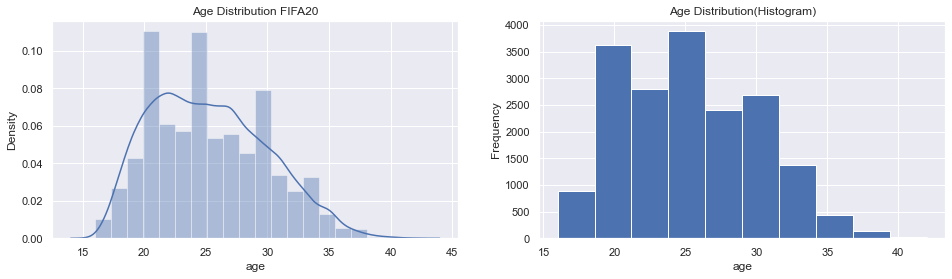

In [16]:
plt.figure(figsize=(16,4))
plt.subplot(1,2,1)
plt.title('Age Distribution FIFA20', fontsize=12)
sns.distplot(a=df['age'], kde=True, bins=20)
plt.subplot(1,2,2)
df['age'].plot(kind="hist")
plt.title("Age Distribution(Histogram)", fontsize=12)
plt.xlabel("age");

__The above histogram shows that most players are 20 years old and 25 years old. Less than 1000 players are 17 to 18 years old. Less than 1500 players are 33 to 35 years old. Very few players are over 35 years old and the number is less than 500.__

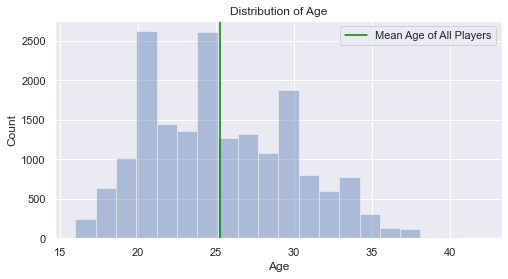

In [17]:
plt.figure(figsize=(8,4))
sns.distplot(a=df['age'],kde=False,bins=20)
plt.axvline(x=np.mean(df['age']),c='green',label='Mean Age of All Players')
plt.legend()
plt.xlabel('Age')
plt.ylabel('Count')
plt.title('Distribution of Age');

__The mean age of Players is 25 years. The distribution of age follows right skewness.__

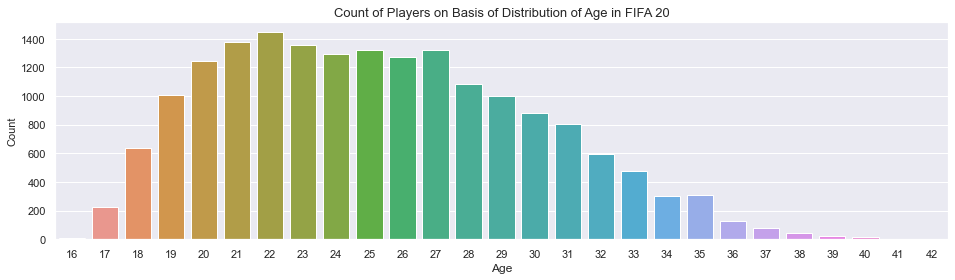

In [18]:
plt.figure(figsize= (16,4))
ax = sns.countplot(x='age', data=df)
ax.set_title(label='Count of Players on Basis of Distribution of Age in FIFA 20', fontsize=13)
ax.set_xlabel(xlabel='Age', fontsize=12)
ax.set_ylabel(ylabel='Count', fontsize=11);

__The Players have their age as 21 and 22 are maximum in number.__

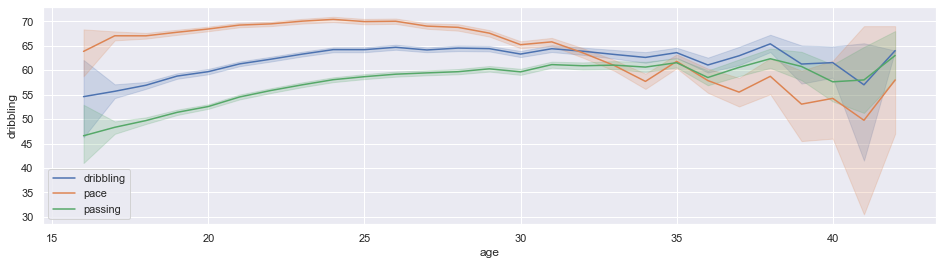

In [19]:
plt.figure(figsize=(16,4))
sns.lineplot(x='age', y='dribbling', data=df, legend='brief', label='dribbling')
sns.lineplot(x='age', y='pace', data=df, legend='brief', label='pace')
sns.lineplot(x='age', y='passing', data=df, legend='brief', label='passing');

__After the age of 30, the dribbling, pace and passing abilities of the player follows a gradual downturn.__

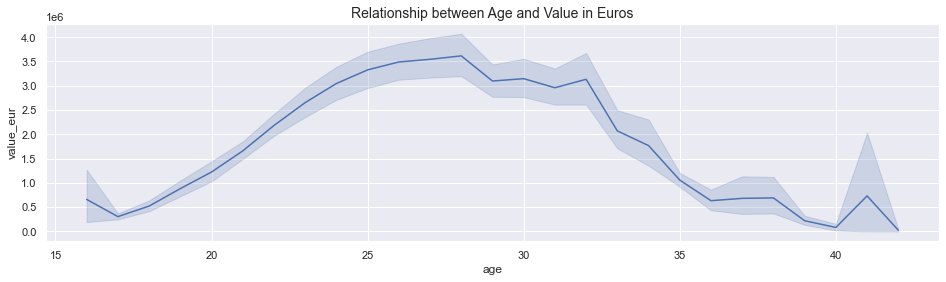

In [20]:
plt.figure(figsize = (16, 4))
sns.lineplot(x=df.age, y=df.value_eur)
plt.title("Relationship between Age and Value in Euros", fontsize=14);

__The Players between the age 25 to 30 receives a high market value in Euros.__

## 2. Nationality

In [21]:
print(df.nationality.unique())
print(len(df.nationality.unique()))
df.nationality.value_counts()

['Argentina' 'Portugal' 'Brazil' 'Slovenia' 'Belgium' 'Germany'
 'Netherlands' 'Croatia' 'Egypt' 'France' 'Senegal' 'England' 'Spain'
 'Italy' 'Uruguay' 'Poland' 'Denmark' 'Gabon' 'Korea Republic'
 'Costa Rica' 'Slovakia' 'Bosnia Herzegovina' 'Serbia' 'Scotland'
 'Hungary' 'Switzerland' 'Greece' 'Austria' 'Morocco' 'Sweden' 'Wales'
 'Colombia' 'Czech Republic' 'Chile' 'Algeria' 'Ivory Coast' 'Togo'
 'Norway' 'Mexico' 'Iceland' 'Finland' 'Jamaica' 'Albania' 'Guinea'
 'Cameroon' 'Ghana' 'Montenegro' 'Ukraine' 'Russia' 'DR Congo'
 'Central African Rep.' 'Venezuela' 'Nigeria' 'Armenia' 'Israel' 'Ecuador'
 'Paraguay' 'Australia' 'Turkey' 'Romania' 'Japan' 'Mali' 'United States'
 'Kosovo' 'Dominican Republic' 'Tanzania' 'China PR' 'Northern Ireland'
 'Republic of Ireland' 'Tunisia' 'Cape Verde' 'FYR Macedonia'
 'Burkina Faso' 'Kenya' 'Angola' 'South Africa' 'Peru' 'Syria' 'Gambia'
 'New Zealand' 'Equatorial Guinea' 'Zimbabwe' 'Georgia' 'Canada' 'Estonia'
 'Benin' 'Bulgaria' 'Mozambique' 'Hon

England                 1667
Germany                 1216
Spain                   1035
France                   984
Argentina                886
Brazil                   824
Italy                    732
Colombia                 591
Japan                    453
Netherlands              416
China PR                 373
Chile                    370
Sweden                   358
Norway                   350
Republic of Ireland      348
United States            347
Denmark                  345
Portugal                 344
Mexico                   340
Poland                   324
Korea Republic           322
Austria                  319
Saudi Arabia             310
Turkey                   294
Romania                  287
Scotland                 277
Belgium                  268
Switzerland              229
Australia                196
Uruguay                  164
Serbia                   139
Ghana                    130
Senegal                  127
Croatia                  126
Nigeria       

__Count of Players on the Basis of Nationality of Top 10 countries__

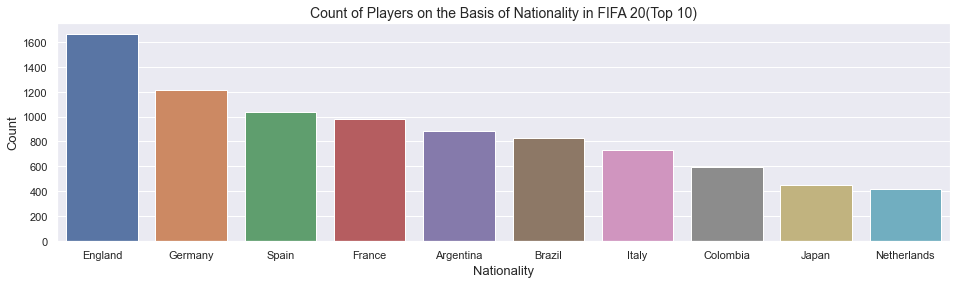

In [22]:
plt.figure(figsize= (16, 4))
ax = sns.countplot(x='nationality', data=df, order=df.nationality.value_counts().iloc[:10].index)
ax.set_title(label='Count of Players on the Basis of Nationality in FIFA 20(Top 10)', fontsize=14)
ax.set_xlabel(xlabel='Nationality', fontsize=13)
ax.set_ylabel(ylabel='Count', fontsize=13);

__England produces the most number of players.__

## Nationality VS Overall Rating

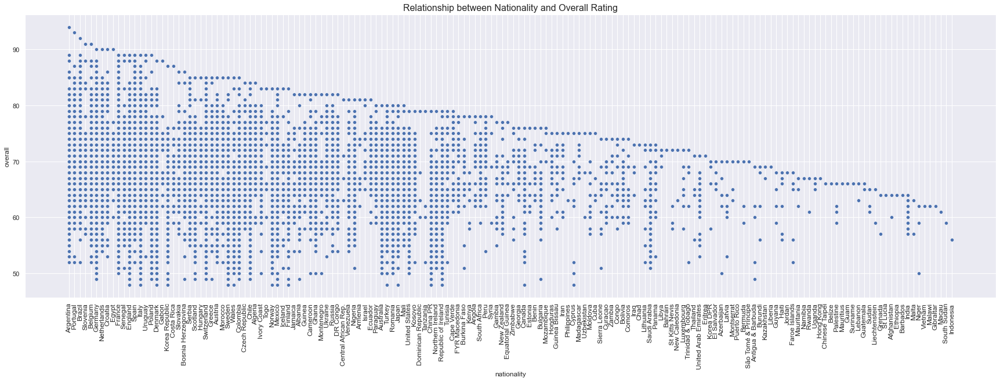

In [23]:
plt.figure(figsize = (30, 9))
sns.scatterplot(x=df.nationality, y=df.overall)
plt.title("Relationship between Nationality and Overall Rating", fontsize=16)
plt.xticks(rotation=90, fontsize=12);

In [24]:
import plotly.graph_objs as go

fig = go.Figure()

fig = go.Figure(data=go.Scatter(x = df['nationality'], y = df['overall'],mode='markers',marker=dict(size=5,
        color=df['overall'], #set color equal to a variable
        colorscale='Plasma', # one of plotly colorscales,
    showscale=True)))
fig.update_layout(title='Nationality vs Overall Rating',
                  xaxis_title='Nationality',
                  yaxis_title='Overall Rating')

__Argentina, Portugal, Brazil are the top 3 Countries with the best overall Rating. Whereas, Macau, South Sudan and Indonesia have the poorest overall ratings.__

## 3. Height

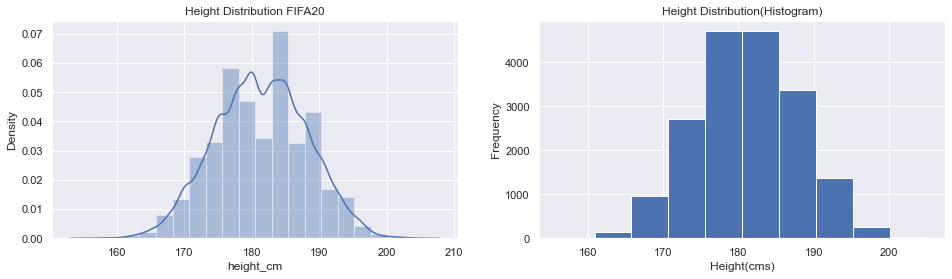

In [25]:
plt.figure(figsize=(16,4))
plt.subplot(1,2,1)
plt.title('Height Distribution FIFA20', fontsize=12)
sns.distplot(a=df['height_cm'], kde=True, bins=20)
plt.subplot(1,2,2)
df['height_cm'].plot(kind="hist")
plt.title("Height Distribution(Histogram)", fontsize=12)
plt.xlabel("Height(cms)");

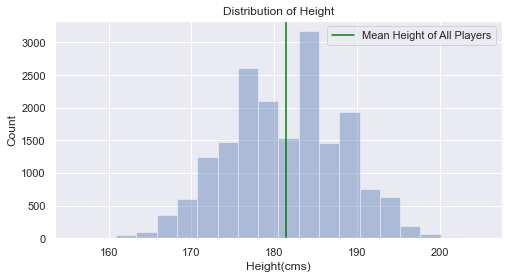

In [26]:
plt.figure(figsize=(8,4))
sns.distplot(a=df['height_cm'],kde=False,bins=20)
plt.axvline(x=np.mean(df['height_cm']),c='green',label='Mean Height of All Players')
plt.legend()
plt.xlabel('Height(cms)')
plt.ylabel('Count')
plt.title('Distribution of Height');

__The mean Height of all the Payers is 181.36cms. The distribution of height almost follows a normal distibution.__

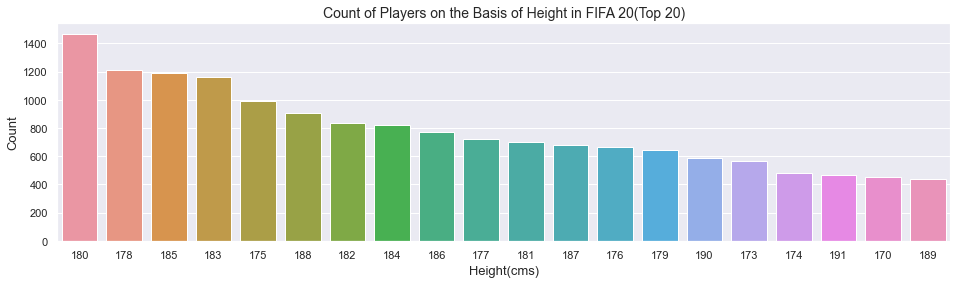

In [27]:
plt.figure(figsize= (16, 4))
ax = sns.countplot(x='height_cm', data=df, order=df.height_cm.value_counts().iloc[:20].index)
ax.set_title(label='Count of Players on the Basis of Height in FIFA 20(Top 20)', fontsize=14)
ax.set_xlabel(xlabel='Height(cms)', fontsize=13)
ax.set_ylabel(ylabel='Count', fontsize=13);

__180 cms is the height of the most number of players.__

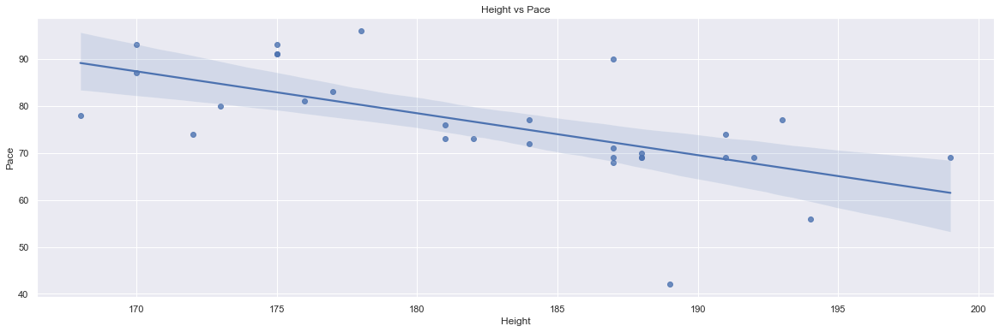

In [28]:
plt.figure(figsize= (20,6))
x=df.head(30)['height_cm']
y=df.head(30)['pace']

sns.regplot(x,y)
plt.title('Height vs Pace')
plt.xlabel('Height')
plt.ylabel('Pace');

__The height of the player is inversely proportional to the "Pace". So, a player's speed on the field decreases with increase in height, which in turn decreases the ability to outrun defenders and create scoring opportunities if it is above average height.__

## 4. Weight

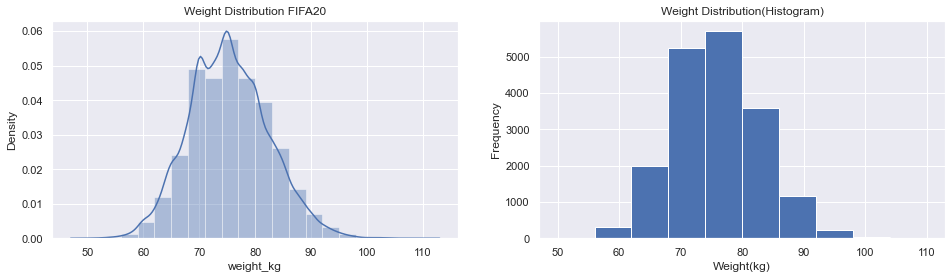

In [29]:
plt.figure(figsize=(16,4))
plt.subplot(1,2,1)
plt.title('Weight Distribution FIFA20', fontsize=12)
sns.distplot(a=df['weight_kg'], kde=True, bins=20)
plt.subplot(1,2,2)
df['weight_kg'].plot(kind="hist")
plt.title("Weight Distribution(Histogram)", fontsize=12)
plt.xlabel("Weight(kg)");

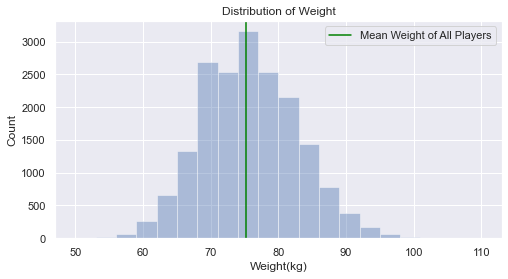

In [30]:
plt.figure(figsize=(8,4))
sns.distplot(a=df['weight_kg'],kde=False,bins=20)
plt.axvline(x=np.mean(df['weight_kg']),c='green',label='Mean Weight of All Players')
plt.legend()
plt.xlabel('Weight(kg)')
plt.ylabel('Count')
plt.title('Distribution of Weight');

__The mean Weight of all the Payers is 75.27 kg. The distribution of weight almost follows a normal distibution.__

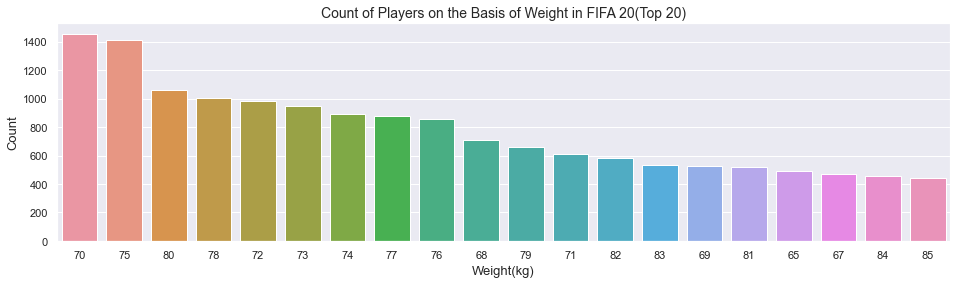

In [31]:
plt.figure(figsize= (16, 4))
ax = sns.countplot(x='weight_kg', data=df, order=df.weight_kg.value_counts().iloc[:20].index)
ax.set_title(label='Count of Players on the Basis of Weight in FIFA 20(Top 20)', fontsize=14)
ax.set_xlabel(xlabel='Weight(kg)', fontsize=13)
ax.set_ylabel(ylabel='Count', fontsize=13);

__The maximum number of Players have thier weights as 70 Kgs and 75 Kgs.__

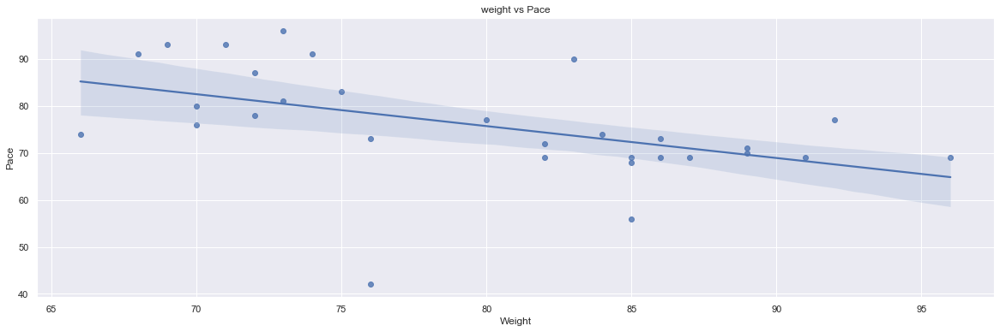

In [32]:
plt.figure(figsize= (20,6))
x=df.head(30)['weight_kg']
y=df.head(30)['pace']

sns.regplot(x,y)
plt.title('weight vs Pace')
plt.xlabel('Weight')
plt.ylabel('Pace');

__The weight of the player is inversely proportional to the "Pace". So, a player's speed on the field decreases with increase in weight, which in turn decreases the ability to outrun defenders and create scoring opportunities if it reaches above average weight.__

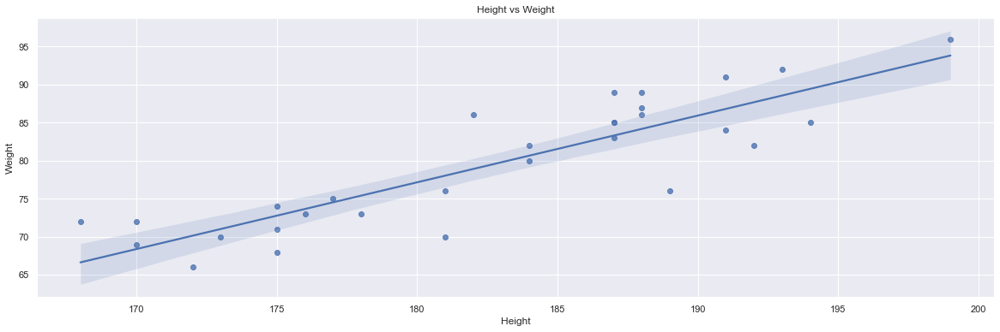

In [33]:
plt.figure(figsize= (20,6))
x=df.head(30)['height_cm']
y=df.head(30)['weight_kg']

sns.regplot(x,y)
plt.title('Height vs Weight')
plt.xlabel('Height')
plt.ylabel('Weight');

__Height and Weight follows a linear relationship.__

## 5. BMI(Body Mass Index)

In [34]:
df['bmi'] = df['weight_kg'] // (df['height_cm']/100)**2

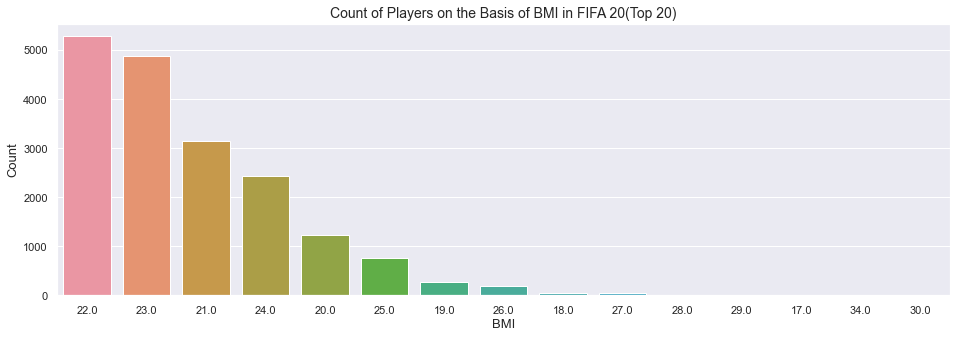

In [35]:
plt.figure(figsize= (16, 5))
ax = sns.countplot(x='bmi', data=df, order=df.bmi.value_counts().iloc[:20].index)
ax.set_title(label='Count of Players on the Basis of BMI in FIFA 20(Top 20)', fontsize=14)
ax.set_xlabel(xlabel='BMI', fontsize=13)
ax.set_ylabel(ylabel='Count', fontsize=13);

__BMI as 22 and 23 is the most common one.__

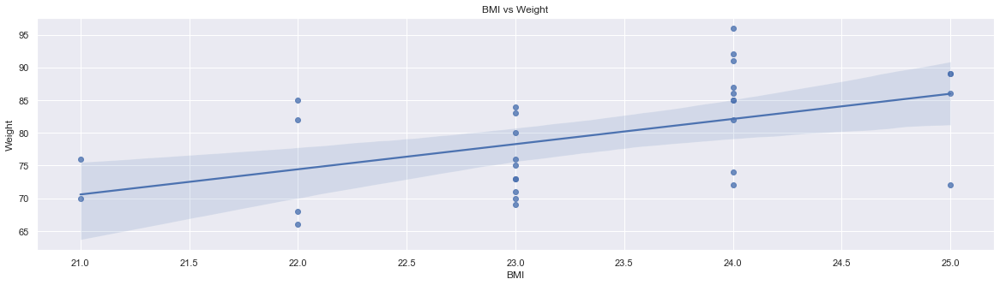

In [36]:
plt.figure(figsize= (20,5))
x=df.head(30)['bmi']
y=df.head(30)['weight_kg']

sns.regplot(x,y)
plt.title('BMI vs Weight')
plt.xlabel('BMI')
plt.ylabel('Weight');

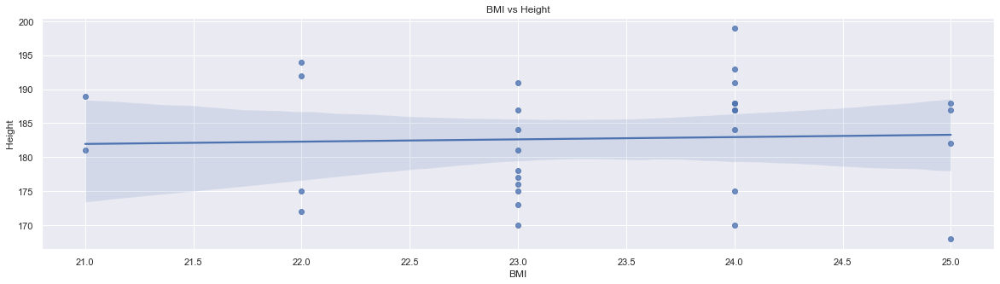

In [37]:
plt.figure(figsize= (20,5))
x=df.head(30)['bmi']
y=df.head(30)['height_cm']

sns.regplot(x,y)
plt.title('BMI vs Height')
plt.xlabel('BMI')
plt.ylabel('Height');

## 6.Overall Rating

In [38]:
mean_rating = df['overall'].mean()
best_player = df.loc[df['overall'].idxmax(), 'short_name']
best_rating = df['overall'].max()
print(f"Mean Overall Rating: {mean_rating:.2f}")
print(f"With an overall rating of {best_rating}, the player in the top position is {best_player}.")

Mean Overall Rating: 66.24
With an overall rating of 94, the player in the top position is L. Messi.


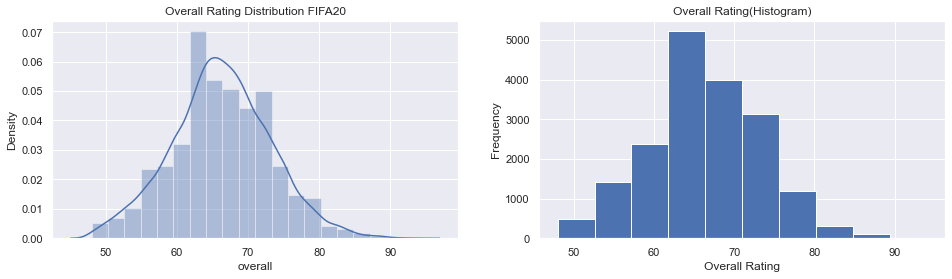

In [39]:
plt.figure(figsize=(16,4))
plt.subplot(1,2,1)
plt.title('Overall Rating Distribution FIFA20', fontsize=12)
sns.distplot(a=df['overall'], kde=True, bins=20)
plt.subplot(1,2,2)
df['overall'].plot(kind="hist")
plt.title("Overall Rating(Histogram)", fontsize=12)
plt.xlabel("Overall Rating");

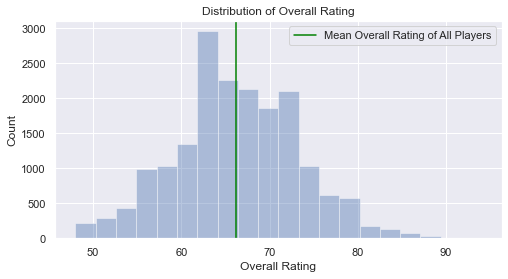

In [40]:
plt.figure(figsize=(8,4))
sns.distplot(a=df['overall'],kde=False,bins=20)
plt.axvline(x=np.mean(df['overall']),c='green',label='Mean Overall Rating of All Players')
plt.legend()
plt.xlabel('Overall Rating')
plt.ylabel('Count')
plt.title('Distribution of Overall Rating');

__The mean overall rating is 66.24 and the distribution of overall rating is slightly right-skewed.__

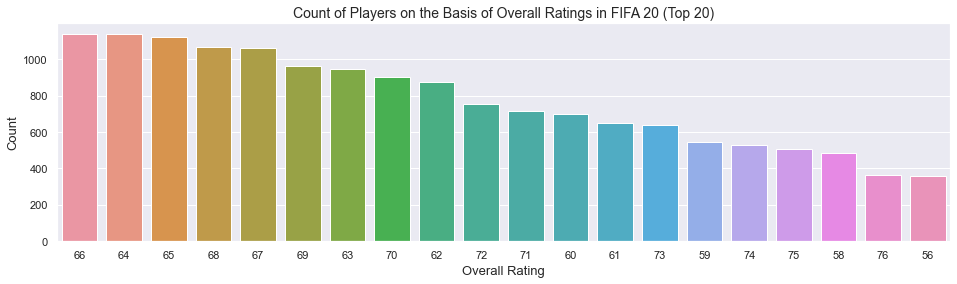

In [41]:
plt.figure(figsize= (16, 4))
ax = sns.countplot(x='overall', data=df, order=df.overall.value_counts().iloc[:20].index)
ax.set_title(label='Count of Players on the Basis of Overall Ratings in FIFA 20 (Top 20)', fontsize=14)
ax.set_xlabel(xlabel='Overall Rating', fontsize=13)
ax.set_ylabel(ylabel='Count', fontsize=13);

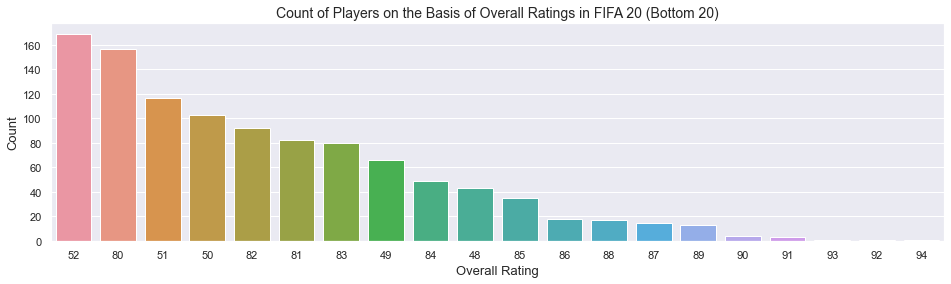

In [42]:
plt.figure(figsize= (16, 4))
ax = sns.countplot(x='overall', data=df, order=df.overall.value_counts().iloc[-20:].index)
ax.set_title(label='Count of Players on the Basis of Overall Ratings in FIFA 20 (Bottom 20)', fontsize=14)
ax.set_xlabel(xlabel='Overall Rating', fontsize=13)
ax.set_ylabel(ylabel='Count', fontsize=13);

### Overall VS different parameters 

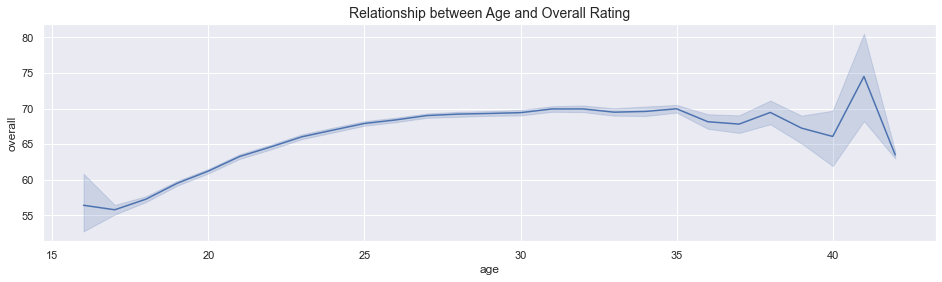

In [43]:
plt.figure(figsize = (16, 4))
sns.lineplot(x=df.age, y=df.overall)
plt.title("Relationship between Age and Overall Rating", fontsize=14);

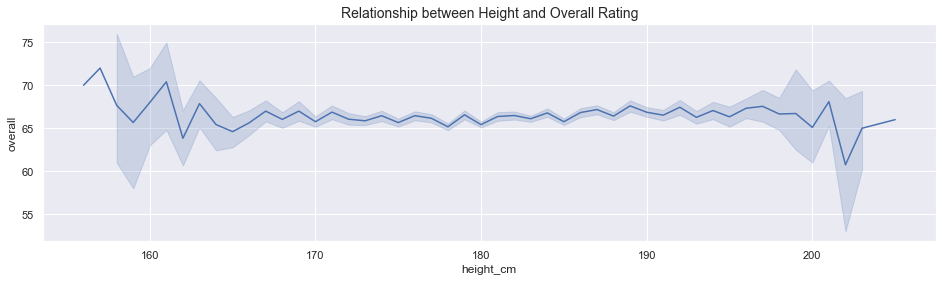

In [44]:
plt.figure(figsize = (16, 4))
sns.lineplot(x=df.height_cm, y=df.overall)
plt.title("Relationship between Height and Overall Rating", fontsize=14);

__The height in range (155-165)cms have better overall and that in range (165-200)cms, the overall is constant and remains equals to 65. After 200 cms the overall increases suddenly and then again decreases after 220 cms and follows a non linear pattern.__

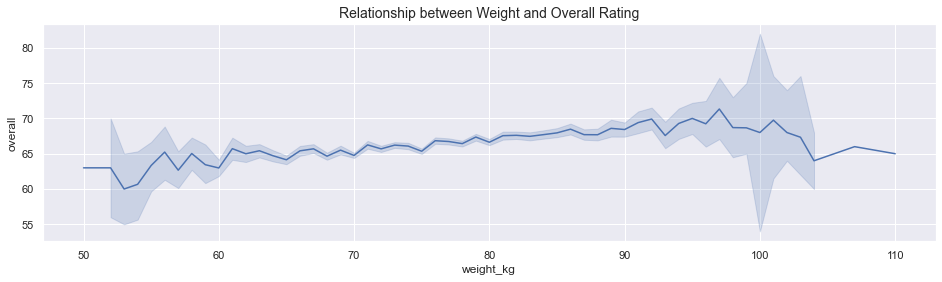

In [45]:
plt.figure(figsize = (16, 4))
sns.lineplot(x=df.weight_kg, y=df.overall)
plt.title("Relationship between Weight and Overall Rating", fontsize=14);

__The weight in range (70-90) Kgs have almost same overall ratings that is around (65-70). And the weight in range (50-60) Kgs and in range (90-110) Kgs they show inconsistency. Especially,(50-60)Kgs have low ratings.__

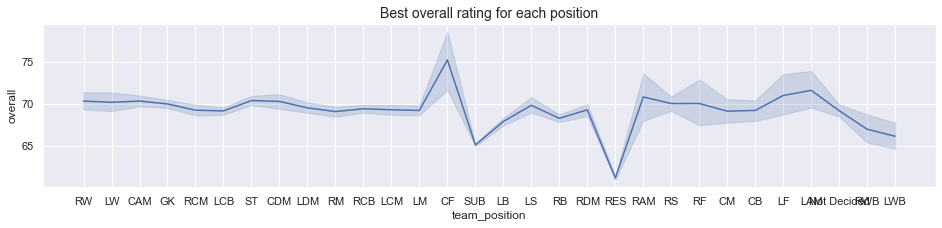

In [46]:
plt.figure(figsize=(16,3))
plt.title('Best overall rating for each position', fontsize=14)
sns.lineplot(data=df, x='team_position', y='overall');

__The Player having postion as "CF" i.e., "Center Forward" has the highest overall rating. Whereas, that with position "RES" has the lowest.__

In [47]:
df_top_rated = df.sort_values(by=["overall"], ascending=False)
df_top_rated.head(2)

,short_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,...,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,bmi
0,L. Messi,32,1987-06-24,170,72,Argentina,FC Barcelona,94,94,95500000,...,66,66,66,68,63,52,52,52,63,24.0
1,Cristiano Ronaldo,34,1985-02-05,187,83,Portugal,Juventus,93,93,58500000,...,61,61,61,65,61,53,53,53,61,23.0


In [48]:
fig = px.pie(df_top_rated.head(25), names='club',
             title='Percentage of Clubs in top 25 players')
fig.show()

__"FC Barcelona", "Liverpool" and "Real Madrid" are the top 3 Clubs containing the most of the Players with the best Overall Ratings.__

In [49]:
fig = px.pie(df_top_rated.head(25), names='nationality',
             title='Percentage of Nations in top 25 players')
fig.show()

__The top 3 Nations producing the Players with the best Overall Ratings are "France", "Spain" and "Argentina".__

## 7. value_eur

In [50]:
mean_rating = df['value_eur'].mean()
best_player = df.loc[df['value_eur'].idxmax(), 'short_name']
best_rating = df['value_eur'].max()
print(f"Mean Value in Euros: {mean_rating:.2f}")
print(f"With a total Value of {best_rating} euros, the player in the top position is {best_player}.")

Mean Value in Euros: 2484037.64
With a total Value of 105500000 euros, the player in the top position is Neymar Jr.


In [51]:
df_high_value = df.sort_values(by=['value_eur'], ascending=False)
df_high_value.head(2)

,short_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,...,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,bmi
2,Neymar Jr,27,1992-02-05,175,68,Brazil,Paris Saint-Germain,92,92,105500000,...,61,61,61,66,61,46,46,46,61,22.0
0,L. Messi,32,1987-06-24,170,72,Argentina,FC Barcelona,94,94,95500000,...,66,66,66,68,63,52,52,52,63,24.0


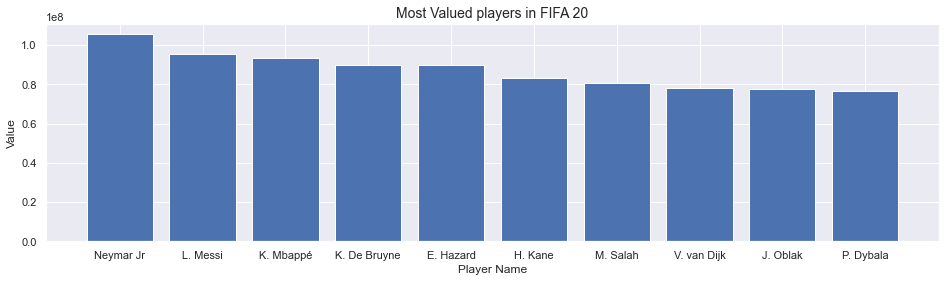

In [52]:
plt.figure(figsize = (16, 4))
plt.bar(df_high_value["short_name"].head(10), df_high_value["value_eur"].head(10))
plt.ylabel("Value")
plt.xlabel("Player Name")
plt.title("Most Valued players in FIFA 20", fontsize=14);

In [53]:
fig = px.pie(df_high_value.head(25), names='club',
             title='Percentage of Clubs in top 25 players with High Values')
fig.show()

__"Manchester City" and "Liverpool" are the top 2 clubs producing the most high-Valued players.__

In [54]:
fig = px.pie(df_high_value.head(25), names='nationality',
             title='Percentage of Nations in top 25 players with High Values')
fig.show()

__"France" and "Argentina" are the top 2 Nations producing the most high-Valued players.__

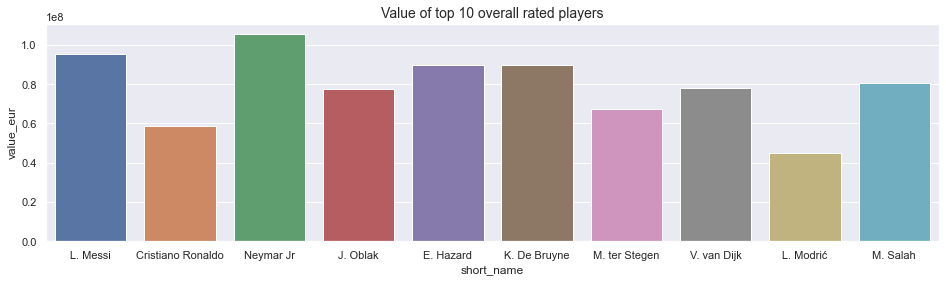

In [55]:
plt.figure(figsize = (16, 4))
sns.barplot(df_top_rated['short_name'].head(10), df_top_rated['value_eur'].head(10)).set_title("Value of top 10 overall rated players", fontsize=14);

__"L. Messi" is the top overall-rated and 2nd most valued player. But "Neymar Jr" is the highest Valued and 2nd most overall rated player.__

## 8. release_clause_eur

In [56]:
df_high_release = df.sort_values(by=['release_clause_eur'], ascending=False)
df_high_release.head(2)

,short_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,...,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,bmi
0,L. Messi,32,1987-06-24,170,72,Argentina,FC Barcelona,94,94,95500000,...,66,66,66,68,63,52,52,52,63,24.0
2,Neymar Jr,27,1992-02-05,175,68,Brazil,Paris Saint-Germain,92,92,105500000,...,61,61,61,66,61,46,46,46,61,22.0


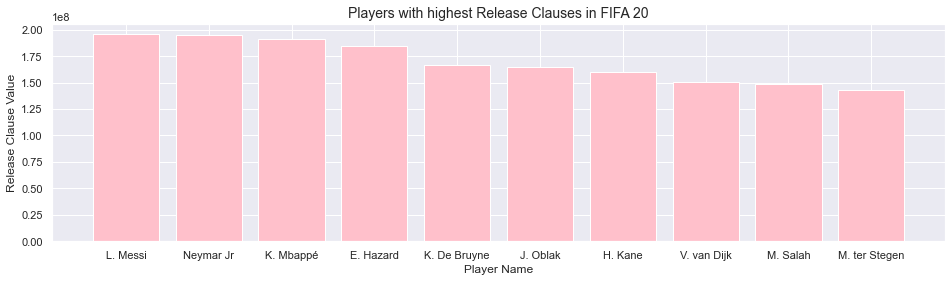

In [57]:
plt.figure(figsize = (16, 4))
plt.bar(df_high_release["short_name"].head(10), df_high_release["release_clause_eur"].head(10), color="pink")
plt.ylabel("Release Clause Value")
plt.xlabel("Player Name")
plt.title("Players with highest Release Clauses in FIFA 20", fontsize=14);

## 9. Wage

In [58]:
df_high_wage = df.sort_values(by=['wage_eur'], ascending=False)
df_high_wage.head(2)

,short_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,...,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,bmi
0,L. Messi,32,1987-06-24,170,72,Argentina,FC Barcelona,94,94,95500000,...,66,66,66,68,63,52,52,52,63,24.0
4,E. Hazard,28,1991-01-07,175,74,Belgium,Real Madrid,91,91,90000000,...,63,63,63,66,61,49,49,49,61,24.0


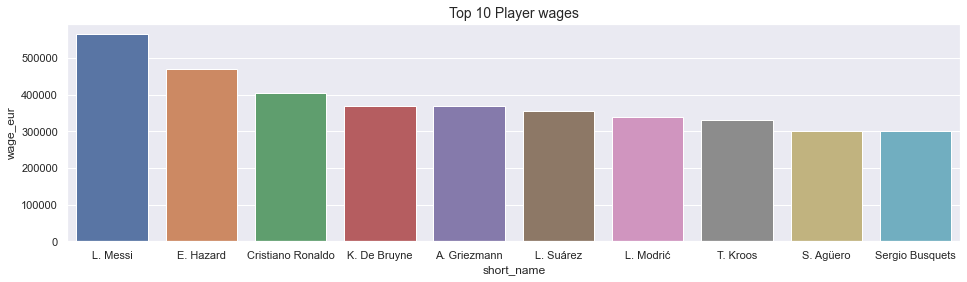

In [59]:
plt.figure(figsize = (16, 4))
sns.barplot(df_high_wage['short_name'].head(10), df_high_wage['wage_eur'].head(10)).set_title("Top 10 Player wages", fontsize=14);

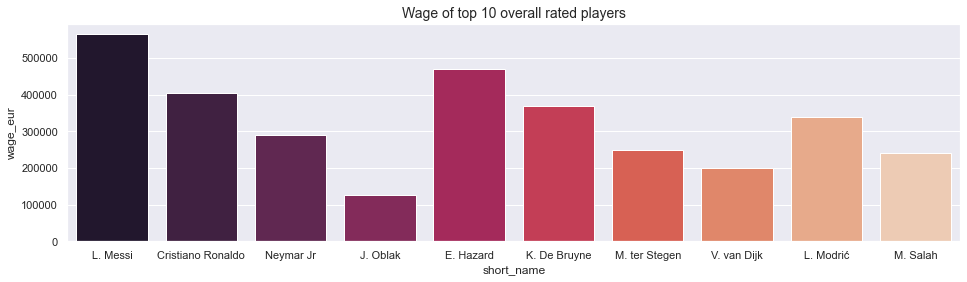

In [60]:
plt.figure(figsize = (16, 4))
sns.barplot(df_top_rated['short_name'].head(10), df_top_rated['wage_eur'].head(10), palette="rocket").set_title("Wage of top 10 overall rated players", fontsize=14);

__"L. Messi", "E. Hazard" and "Cristiano Ronaldo" are the top 3 overall rated players receiving the highest salaries i.e., Wages in Euros.__

In [61]:
fig = px.scatter_3d(df_top_rated.head(20), x='potential', y='overall', z='wage_eur',
              color='short_name')
fig.update_layout(title='3D Plot of Potential, Overall and Wage in Euros of Top 20 FIFA Players')
fig.show()

In [62]:
fig = px.scatter_3d(df_top_rated.head(20), x='potential', y='overall', z='value_eur',
              color='short_name')
fig.update_layout(title='3D Plot of Potential, Overall and Value in Euros of Top 20 FIFA Players')
fig.show()

Insight from both the figures : __"L. Messi" emerges out to be the best player with an overall : "94", potential : "94", Wage : "565k Euros" and Value : "95.5M Euros".__

## 10. Team Position

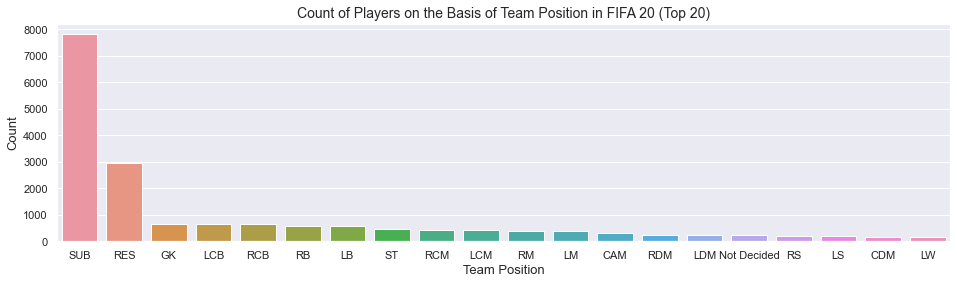

In [63]:
plt.figure(figsize= (16, 4))
ax = sns.countplot(x='team_position', data=df, order=df.team_position.value_counts().iloc[:20].index)
ax.set_title(label='Count of Players on the Basis of Team Position in FIFA 20 (Top 20)', fontsize=14)
ax.set_xlabel(xlabel='Team Position', fontsize=13)
ax.set_ylabel(ylabel='Count', fontsize=13);

### 10.1.Attackers

In [64]:
df_top_attackers = df[df['team_position'].str.contains('ST|RW|LW|CF|LS|RS')].sort_values(by="overall", ascending=False)
df_top_attackers.head(2)

,short_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,...,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,bmi
0,L. Messi,32,1987-06-24,170,72,Argentina,FC Barcelona,94,94,95500000,...,66,66,66,68,63,52,52,52,63,24.0
1,Cristiano Ronaldo,34,1985-02-05,187,83,Portugal,Juventus,93,93,58500000,...,61,61,61,65,61,53,53,53,61,23.0


In [65]:
print("Top 10 FIFA Attackers:\n")
print(df_top_attackers['short_name'].head(10).to_string(index=True))

Top 10 FIFA Attackers:

0              L. Messi
1     Cristiano Ronaldo
4             E. Hazard
9              M. Salah
10            K. Mbappé
12              H. Kane
17            S. Agüero
19            L. Suárez
20       R. Lewandowski
22         A. Griezmann


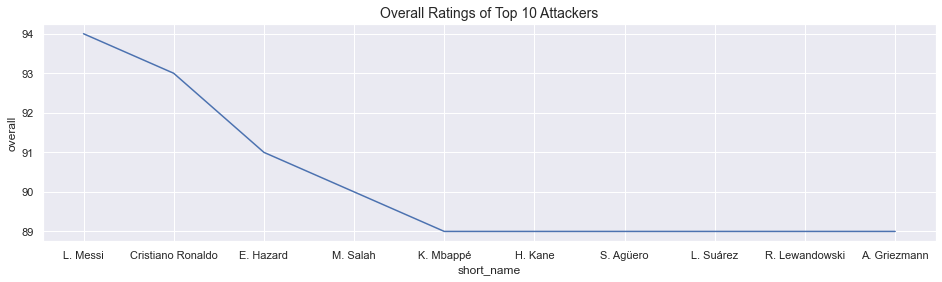

In [66]:
plt.figure(figsize = (16, 4))
sns.lineplot(df_top_attackers['short_name'].head(10), df_top_attackers['overall'].head(10)).set_title("Overall Ratings of Top 10 Attackers", fontsize=14);

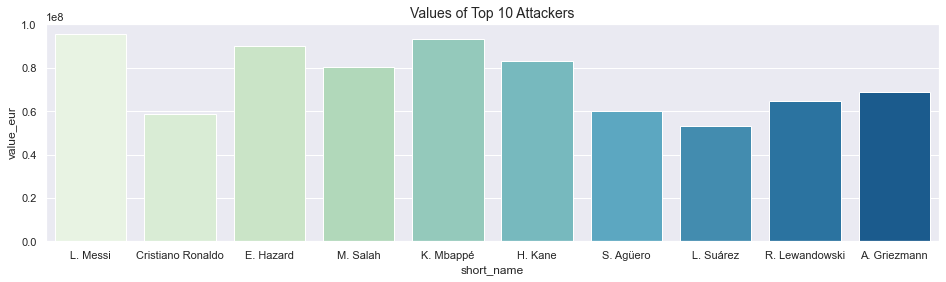

In [67]:
plt.figure(figsize = (16, 4))
sns.barplot(df_top_attackers['short_name'].head(10), df_top_attackers['value_eur'].head(10), palette="GnBu").set_title("Values of Top 10 Attackers", fontsize=14);

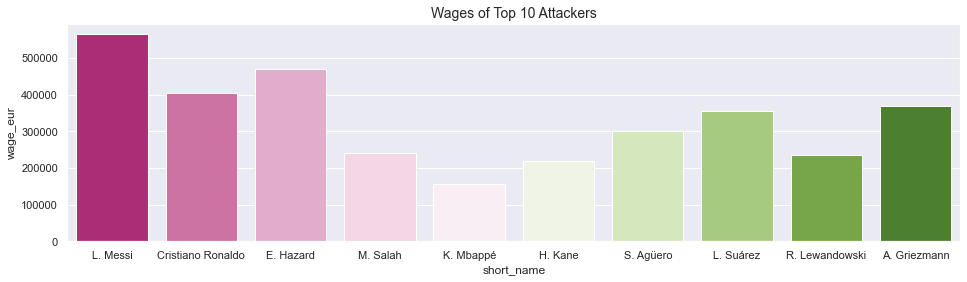

In [68]:
plt.figure(figsize = (16, 4))
sns.barplot(df_top_attackers['short_name'].head(10), df_top_attackers['wage_eur'].head(10), palette="PiYG").set_title("Wages of Top 10 Attackers", fontsize=14);

__"L. Messi", the most powerful attacker, has the highest overall, highest market value i.e., values in Euros and receives the highest salary i.e., wages in euros.__

In [69]:
attack = ['LW', 'RW', 'ST', 'LF', 'RF', 'CF', 'LS', 'RS']
data = df.query('team_position in @attack')    
fig = px.pie(data, names='team_position',
             color_discrete_sequence=px.colors.sequential.Bluered,
             title='Percentages of Player Attacking Positions')
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.update_layout()
fig.show()

__ST(Striker) is the most preferred attacking position.__

### 10.2 Mid-Fielder

In [70]:
df_top_midfield = df[df['team_position'].str.contains('CM|CAM|CDM|LM|RM')].sort_values(by="overall", ascending=False)

In [71]:
print("Top 10 FIFA Mid-Fielders:\n")
print(df_top_midfield['short_name'].head(10).to_string(index=True))

Top 10 FIFA Mid-Fielders:

2           Neymar Jr
5        K. De Bruyne
8           L. Modrić
15           N. Kanté
21    Sergio Busquets
27         C. Eriksen
33        David Silva
36           T. Kroos
37            M. Reus
38      P. Aubameyang


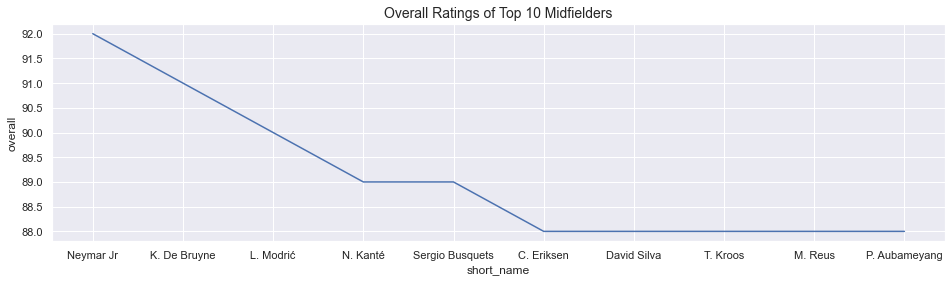

In [72]:
plt.figure(figsize = (16, 4))
sns.lineplot(df_top_midfield['short_name'].head(10), df_top_midfield['overall'].head(10), palette="Spectral").set_title("Overall Ratings of Top 10 Midfielders", fontsize=14);

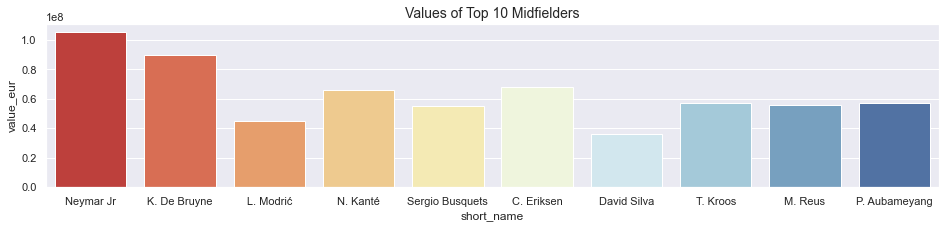

In [73]:
plt.figure(figsize = (16, 3))
sns.barplot(df_top_midfield['short_name'].head(10), df_top_midfield['value_eur'].head(10), palette="RdYlBu").set_title("Values of Top 10 Midfielders", fontsize=14);

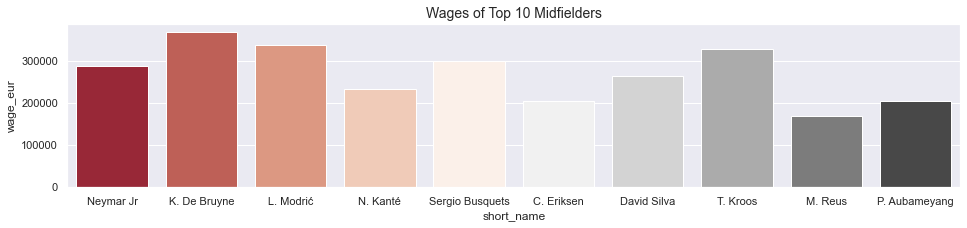

In [74]:
plt.figure(figsize = (16, 3))
sns.barplot(df_top_midfield['short_name'].head(10), df_top_midfield['wage_eur'].head(10), palette="RdGy").set_title("Wages of Top 10 Midfielders", fontsize=14);

__"Neymar Jr", the most powerful mid-fielder, has the highest overall, highest market value i.e., values in Euros. But K. De Bruyne receives the highest salary i.e., wages in euros.__

In [75]:
mid = ['CM', 'RCM', 'LCM', 'RM', 'LM', 'CAM', 'RDM', 'LDM', 'CDM', 'RAM', 'LAM']
data = df.query('team_position in @mid')    
fig = px.pie(data, names='team_position',
             color_discrete_sequence=px.colors.sequential.Agsunset,
             title='Percentages of Player Midfield Positions')
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.update_layout()
fig.show()

3 Most preferred mid-field position:__"RCM"(Right Center Midfielder), "LCM"(Left Center Midfielder) and "RM"(Right Midfielder)__

### 10.3 Defenders

In [76]:
df_top_defend = df[df['team_position'].str.contains('CB|LB|RB|LWB|RWB')].sort_values(by="overall", ascending=False)

In [77]:
print("Top 10 FIFA Defenders:\n")
print(df_top_defend['short_name'].head(10).to_string(index=True))

Top 10 FIFA Defenders:

7         V. van Dijk
16       G. Chiellini
18       Sergio Ramos
11       K. Koulibaly
29              Piqué
35           D. Godín
49         M. Hummels
51         Jordi Alba
50    T. Alderweireld
47      J. Vertonghen


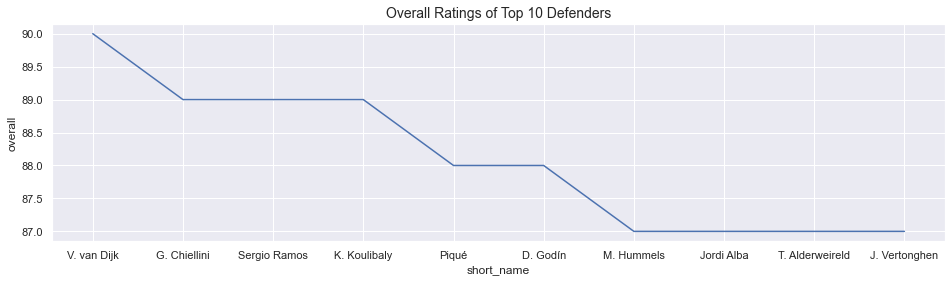

In [78]:
plt.figure(figsize = (16, 4))
sns.lineplot(df_top_defend['short_name'].head(10), df_top_defend['overall'].head(10), palette="PRGn").set_title("Overall Ratings of Top 10 Defenders", fontsize=14);

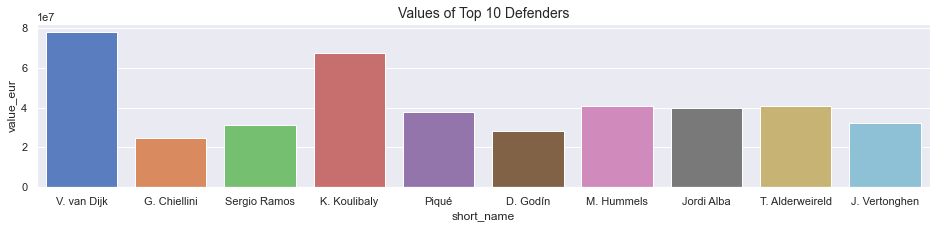

In [79]:
plt.figure(figsize = (16, 3))
sns.barplot(df_top_defend['short_name'].head(10), df_top_defend['value_eur'].head(10), palette="muted").set_title("Values of Top 10 Defenders", fontsize=14);

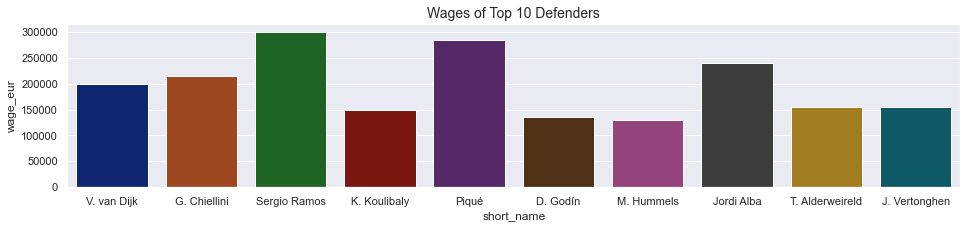

In [80]:
plt.figure(figsize = (16, 3))
sns.barplot(df_top_defend['short_name'].head(10), df_top_defend['wage_eur'].head(10), palette="dark").set_title("Wages of Top 10 Defenders", fontsize=14);

__"V. van Dijk", the most powerful defender, has the highest overall, highest market value i.e., values in Euros. But K. Koulibaly receives the highest salary i.e., wages in euros.__

In [81]:
defence = ['LWB', 'RWB', 'CB', 'LB', 'RB', 'LCB', 'RCB']
data = df.query('team_position in @defence')   
fig = px.pie(data, names='team_position',
             color_discrete_sequence=px.colors.sequential.Sunsetdark,
             title='Percentages of Player Defending Positions')
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.update_layout()
fig.show()

4 Most preferred defending positions:__"LCB"(Left Center Back), "RCB"(Right Center Back), "LB"(Left Back) and "RB"(Right Back).__

## 11. Preferred Foot

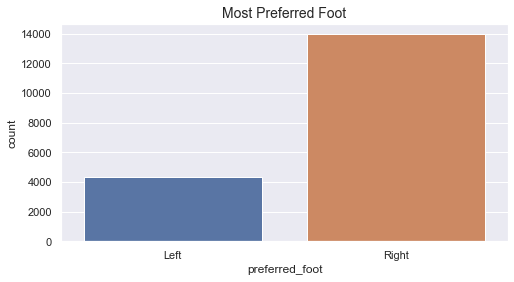

In [82]:
plt.rcParams['figure.figsize']=(8, 4)
sns.countplot(df['preferred_foot'])
plt.title("Most Preferred Foot", fontsize=14);

In [83]:
foot = ['Left', 'Right']
data = df.query('preferred_foot in @foot')    
fig = px.pie(data, names='preferred_foot',
             color_discrete_sequence=px.colors.sequential.Blues_r,
             title='Overall Preferred foot percentages')
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.update_layout()
fig.show()

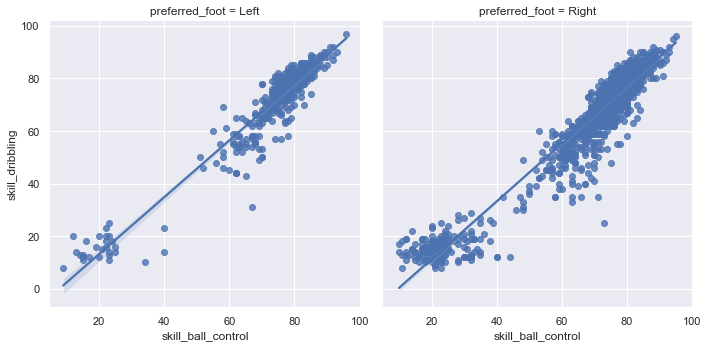

In [84]:
sns.lmplot(x='skill_ball_control', y='skill_dribbling', data=df[:2000], col='preferred_foot');

__A player's ability to receive and control the ball when it comes to them that is skill ball control is more prominent for preferred foot= "Right".__

## 12. Potential

In [85]:
mean_rating = df['potential'].mean()
best_player = df.loc[df['potential'].idxmax(), 'short_name']
age_1 = df.loc[df['potential'].idxmax(), 'age']
best_rating = df['potential'].max()
print(f"Mean Potential: {mean_rating:.2f}")
print(f"With a Potential of {best_rating}, the player in the top position is {best_player}, and his age is {age_1}.")

Mean Potential: 71.55
With a Potential of 95, the player in the top position is K. Mbappé, and his age is 20.


In [86]:
young_talent = df[df['age']<=22]
young_talent.sort_values(by=["potential"], ascending=False).head(2)

,short_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,...,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,bmi
10,K. Mbappé,20,1998-12-20,178,73,France,Paris Saint-Germain,89,95,93500000,...,62,62,62,66,63,54,54,54,63,23.0
411,João Félix,19,1999-11-10,181,70,Portugal,Atlético Madrid,80,93,28000000,...,59,59,59,62,59,53,53,53,59,21.0


In [87]:
most_valuable_young = young_talent.sort_values(by=["overall"], ascending=False)
most_valuable_young.head(2)

,short_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,...,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,bmi
10,K. Mbappé,20,1998-12-20,178,73,France,Paris Saint-Germain,89,95,93500000,...,62,62,62,66,63,54,54,54,63,23.0
74,G. Donnarumma,20,1999-02-25,196,90,Italy,Milan,85,92,41500000,...,0,0,0,0,0,0,0,0,0,23.0


In [88]:
print("Mean age of most_valuable_young:",most_valuable_young['age'].mean())
print("Mean value of most_valuable_young:",most_valuable_young['value_eur'].mean())

Mean age of most_valuable_young: 20.20822147651007
Mean value of most_valuable_young: 1386447.9865771811


In [89]:
young_talent.sort_values(by=["release_clause_eur"], ascending=False).head(2)

,short_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,...,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,bmi
10,K. Mbappé,20,1998-12-20,178,73,France,Paris Saint-Germain,89,95,93500000,...,62,62,62,66,63,54,54,54,63,23.0
75,F. de Jong,22,1997-05-12,180,74,Netherlands,FC Barcelona,85,91,52000000,...,82,82,82,81,79,76,76,76,79,22.0


In [90]:
df_overall_80 = df_top_rated.loc[df_top_rated['overall']>=80,:]
df_overall_80[['short_name','age','overall','potential','value_eur']].head(2)

,short_name,age,overall,potential,value_eur
0,L. Messi,32,94,94,95500000
1,Cristiano Ronaldo,34,93,93,58500000


#### Correlation plots between various parameters

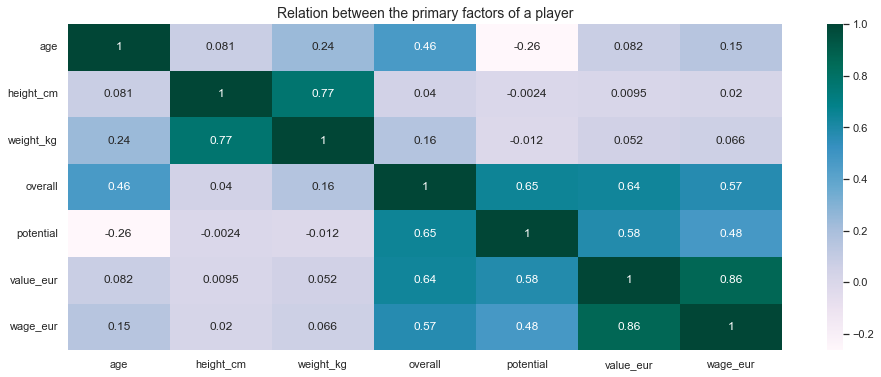

In [91]:
plt.figure(figsize=(16,6))
plt.title("Relation between the primary factors of a player", fontsize=14)
sns.heatmap(df.corr().loc['age':'wage_eur', 'age':'wage_eur'], annot=True, cbar=True, cmap="PuBuGn");

* __We can see a strong position correlation between overall score and potential which is .65, which means as potential increases overall score increases as well.__
* __There is a negative correlation between age, height and weight with potential and that means as players get older potential decreases.__
* __But interesting fact is that age, height and weight are positively correlated with overall score.__
* __Also, if overall increases, potential score also increases.__

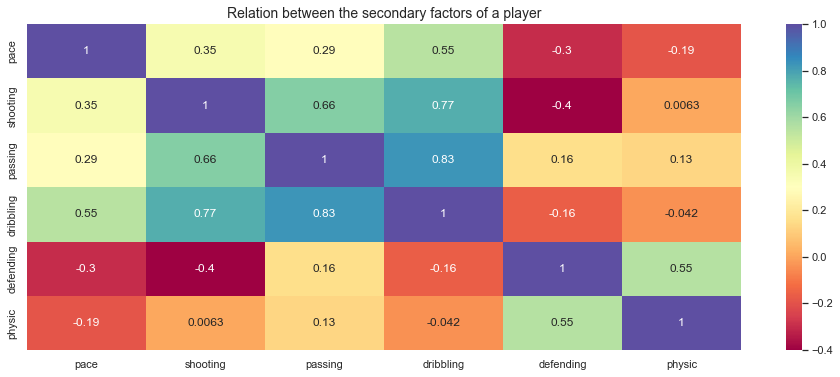

In [92]:
plt.figure(figsize=(16,6))
plt.title("Relation between the secondary factors of a player", fontsize=14)
sns.heatmap(df.corr().loc['pace':'physic', 'pace':'physic'], annot=True, cbar=True, cmap="Spectral");

* __Pace has negative correlation with physic and defending which means a player's strength andability to win the ball back decreases if pace increases.__
* __Also, pace has positive correlation with dribbling, passing and shooting.__
* __Shooting is highly correlated with passing and dribbling and has negative correlation with defending.__
* __Passing and dribbling are highly correlated.__
* __Dribbling has a negative correlation with defending and physic.__

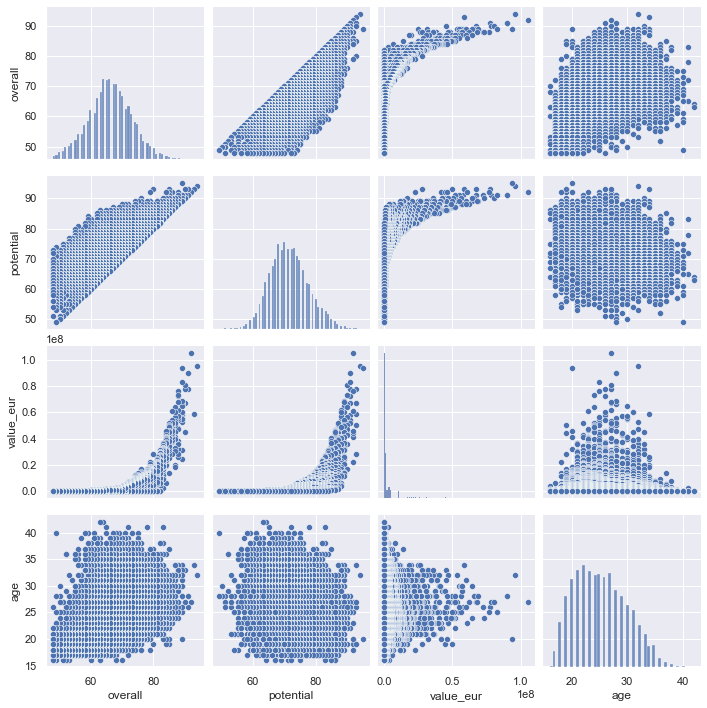

In [93]:
sns.pairplot((df[['overall', 'potential', 'value_eur','age']]));

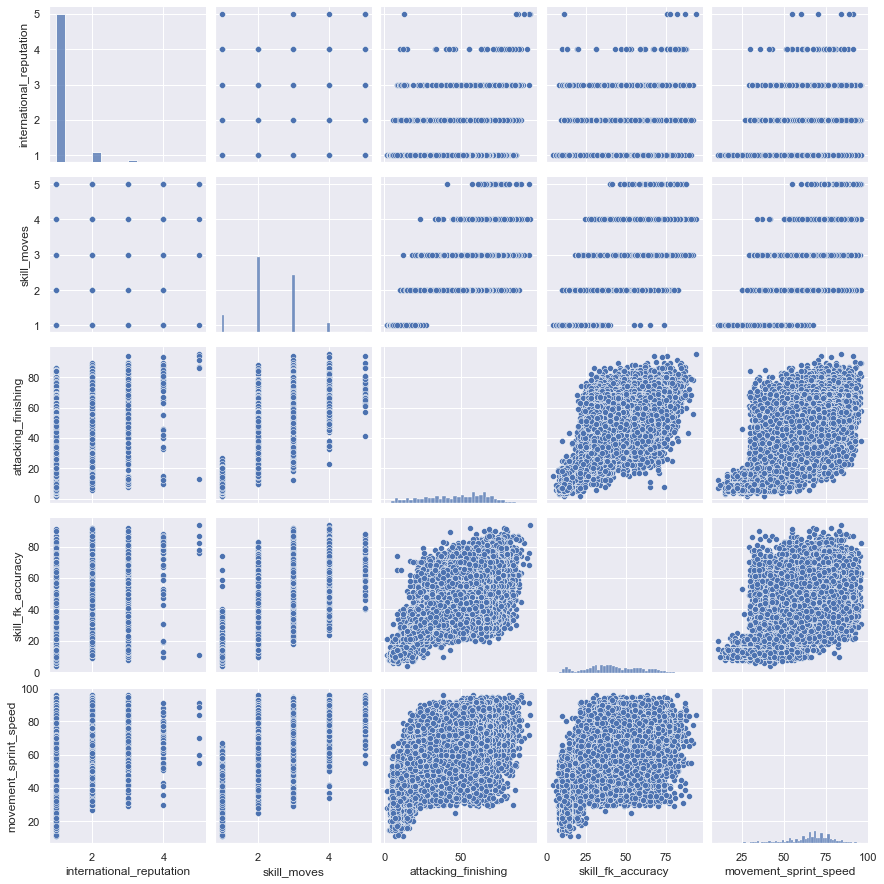

In [94]:
sns.pairplot(df[["international_reputation","skill_moves", "attacking_finishing", "skill_fk_accuracy", "movement_sprint_speed"]], palette="deep");

## 13. Player Position

In [95]:
fifa_potential=df[(df.potential>85)&(df.overall<80)]
fifa_potential_ready=fifa_potential[(fifa_potential.overall<80)&(fifa_potential.overall>70)]

**13.1 Potential Goal Keeper**

In [96]:
position="GK"
fifa_potential_ready_GK=fifa_potential_ready[df.player_positions.str.contains(position)]
fig=go.Figure(data=[go.Bar(name='overall', x=fifa_potential_ready_GK.short_name, y=fifa_potential_ready_GK.overall, text=fifa_potential_ready_GK.overall, textposition='auto'),
                   go.Bar(name='potential', x=fifa_potential_ready_GK.short_name, y=fifa_potential_ready_GK.potential, text=fifa_potential_ready_GK.potential, textposition='auto')
                   ])
fig.update_layout(title='Top potential GK in FIFA 20',
                   xaxis_title='player name ',
                   yaxis_title='Rating')
fig.data[0].marker.line.width = 1
fig.data[0].marker.line.color = "black"
fig.data[1].marker.line.width = 1
fig.data[1].marker.line.color = "black"
fig.show()

**13.2 Top Potential Left-back players in FIFA 20**

In [97]:
position='LB'
position1='LWB'
fifa_potential_LB=fifa_potential_ready[(df.player_positions.str.contains(position))|(df.player_positions.str.contains(position1))]
fig=go.Figure(data=[
                    go.Bar(name='overall', x=fifa_potential_LB.short_name, y=fifa_potential_LB.overall, text=fifa_potential_LB.overall, textposition='auto'),
                    go.Bar(name='potential', x=fifa_potential_LB.short_name, y=fifa_potential_LB.potential, text=fifa_potential_LB.potential, textposition='auto')
                   ])
fig.update_layout(title='Top Potential LB in FIFA20', xaxis_title='player name', yaxis_title='rating')
fig.data[0].marker.line.width = 1
fig.data[0].marker.line.color = "black"
fig.data[1].marker.line.width = 1
fig.data[1].marker.line.color = "black"
fig.show()

**13.3 Top Potentital Players in Right back Position**

In [98]:
position="RB"
position1="RWB"
fifa_potential_RB=fifa_potential_ready[(df.player_positions.str.contains(position))|(df.player_positions.str.contains(position1))]
fig=go.Figure(data=[
                    go.Bar(name='overall', x=fifa_potential_RB.short_name, y=fifa_potential_RB.overall, text=fifa_potential_RB.overall, textposition='auto'),
                    go.Bar(name='potential', x=fifa_potential_RB.short_name, y=fifa_potential_RB.potential, text=fifa_potential_RB.potential, textposition='auto')
                   ])
fig.update_layout(title='Top Potential RB in FIFA20', xaxis_title='player name', yaxis_title='rating')
fig.data[0].marker.line.width = 1
fig.data[0].marker.line.color = "black"
fig.data[1].marker.line.width = 1
fig.data[1].marker.line.color = "black"
fig.show()

**13.4 Top Potential Centre back in FIFA20**

In [99]:
position="CB"
fifa_potential_CB=fifa_potential_ready[df.player_positions.str.contains(position)]
fig=go.Figure(data=[
    go.Bar(name='overall', x=fifa_potential_CB.short_name, y=fifa_potential_CB.overall, text=fifa_potential_CB.overall, textposition='auto'),
    go.Bar(name='overall', x=fifa_potential_CB.short_name, y=fifa_potential_CB.potential, text=fifa_potential_CB.potential, textposition='auto')
])
fig.update_layout(title='Top Potential CB in FIFA20', xaxis_title='player name', yaxis_title='rating')
fig.data[0].marker.line.width=1
fig.data[0].marker.line.color="black"
fig.data[1].marker.line.width=1
fig.data[1].marker.line.color="black"
fig.show()

**13.5 Top Potential CM in FIFA20**

In [100]:
position="CM"
fifa_potential_CM=fifa_potential_ready[df.player_positions.str.contains(position)]
fig=go.Figure(data=[
    go.Bar(name='overall', x=fifa_potential_CM.short_name, y=fifa_potential_CM.overall, text=fifa_potential_CM.overall, textposition='auto'),
    go.Bar(name='overall', x=fifa_potential_CM.short_name, y=fifa_potential_CM.potential, text=fifa_potential_CM.potential, textposition='auto')
])
fig.update_layout(title='Top Potential CM in FIFA20', xaxis_title='player name', yaxis_title='rating')
fig.data[0].marker.line.width=1
fig.data[0].marker.line.color="black"
fig.data[1].marker.line.width=1
fig.data[1].marker.line.color="black"
fig.show()

**13.6 Top Potential CAM position**

In [101]:
position="CAM"
fifa_potential_CAM=fifa_potential_ready[df.player_positions.str.contains(position)]
fig=go.Figure(data=[
    go.Bar(name='overall', x=fifa_potential_CAM.short_name, y=fifa_potential_CAM.overall, text=fifa_potential_CAM.overall, textposition='auto'),
    go.Bar(name='overall', x=fifa_potential_CAM.short_name, y=fifa_potential_CAM.potential, text=fifa_potential_CAM.potential, textposition='auto')
])
fig.update_layout(title='Top Potential CAM in FIFA20', xaxis_title='player name', yaxis_title='rating')
fig.data[0].marker.line.width=1
fig.data[0].marker.line.color="black"
fig.data[1].marker.line.width=1
fig.data[1].marker.line.color="black"
fig.show()

**13.7 Top Potential CDM players**

In [102]:
position="CDM"
fifa_potential_CDM=fifa_potential_ready[df.player_positions.str.contains(position)]
fig=go.Figure(data=[
    go.Bar(name='overall', x=fifa_potential_CDM.short_name, y=fifa_potential_CDM.overall, text=fifa_potential_CDM.overall, textposition='auto'),
    go.Bar(name='overall', x=fifa_potential_CDM.short_name, y=fifa_potential_CDM.potential, text=fifa_potential_CDM.potential, textposition='auto')
])
fig.update_layout(title='Top Potential CDM in FIFA20', xaxis_title='player name', yaxis_title='rating')
fig.data[0].marker.line.width=1
fig.data[0].marker.line.color="black"
fig.data[1].marker.line.width=1
fig.data[1].marker.line.color="black"
fig.show()

**13.8 Top Potential LW players in FIFA20**

In [103]:
position="LW"
fifa_potential_LW=fifa_potential_ready[df.player_positions.str.contains(position)]
fig=go.Figure(data=[
    go.Bar(name='overall', x=fifa_potential_LW.short_name, y=fifa_potential_LW.overall, text=fifa_potential_LW.overall, textposition='auto'),
    go.Bar(name='overall', x=fifa_potential_LW.short_name, y=fifa_potential_LW.potential, text=fifa_potential_LW.potential, textposition='auto')
])
fig.update_layout(title='Top Potential LW in FIFA20', xaxis_title='player name', yaxis_title='rating')
fig.data[0].marker.line.width=1
fig.data[0].marker.line.color="black"
fig.data[1].marker.line.width=1
fig.data[1].marker.line.color="black"
fig.show()

**13.9 Top potential RW in FIFA20**

In [104]:
position="RW"
fifa_potential_RW=fifa_potential_ready[df.player_positions.str.contains(position)]
fig=go.Figure(data=[
    go.Bar(name='overall', x=fifa_potential_RW.short_name, y=fifa_potential_RW.overall, text=fifa_potential_RW.overall, textposition='auto'),
    go.Bar(name='overall', x=fifa_potential_RW.short_name, y=fifa_potential_RW.potential, text=fifa_potential_RW.potential, textposition='auto')
])
fig.update_layout(title='Top Potential RW in FIFA20', xaxis_title='player name', yaxis_title='rating')
fig.data[0].marker.line.width=1
fig.data[0].marker.line.color="black"
fig.data[1].marker.line.width=1
fig.data[1].marker.line.color="black"
fig.show()

**13.10 Top potetial Striker in FIFA20**

In [105]:
position="ST"
fifa_potential_ST=fifa_potential_ready[df.player_positions.str.contains(position)]
fig=go.Figure(data=[
    go.Bar(name='overall', x=fifa_potential_ST.short_name, y=fifa_potential_ST.overall, text=fifa_potential_ST.overall, textposition='auto'),
    go.Bar(name='overall', x=fifa_potential_ST.short_name, y=fifa_potential_ST.potential, text=fifa_potential_ST.potential, textposition='auto')
])
fig.update_layout(title='Top Potential ST in FIFA20', xaxis_title='player name', yaxis_title='rating')
fig.data[0].marker.line.width=1
fig.data[0].marker.line.color="black"
fig.data[1].marker.line.width=1
fig.data[1].marker.line.color="black"
fig.show()

**13.11 Top potential Center Forward in FIFA20**

In [106]:
position="CF"
fifa_potential_CF=fifa_potential_ready[df.player_positions.str.contains(position)]
fig=go.Figure(data=[
    go.Bar(name='overall', x=fifa_potential_CF.short_name, y=fifa_potential_CF.overall, text=fifa_potential_CF.overall, textposition='auto'),
    go.Bar(name='overall', x=fifa_potential_CF.short_name, y=fifa_potential_CF.potential, text=fifa_potential_CF.potential, textposition='auto')
])
fig.update_layout(title='Top Potential CF in FIFA20', xaxis_title='player name', yaxis_title='rating')
fig.data[0].marker.line.width=1
fig.data[0].marker.line.color="black"
fig.data[1].marker.line.width=1
fig.data[1].marker.line.color="black"
fig.show()

## 14. Pace

In [107]:
df_pace=df.sort_values(by="pace", ascending=False)

In [108]:
print("Top 10 Players with highest Pace values:\n")
print(df_pace['short_name'].head(10).to_string(index=True))

Top 10 Players with highest Pace values:

2167       Adama Traoré
10            K. Mbappé
6495           K. Nagai
55              L. Sané
9065           A. Chalá
256      Gelson Martins
6957          C. Bărbuț
13334           E. List
38        P. Aubameyang
2361            J. Damm


#### Some parameters related to Pace(movement_sprint_speed, skill_fk_accuracy, skill_moves, attacking_finishing)

In [109]:
top_speed = df.sort_values(by=['movement_sprint_speed'], ascending=False)
free_kick = df.sort_values(by=['skill_fk_accuracy'], ascending=False)
skill_moves = df.sort_values(by=['skill_moves'], ascending=False)
finishing = df.sort_values(by=['attacking_finishing'], ascending=False)

In [110]:
top_speed = top_speed.head(10)
free_kick = free_kick.head(10)
skill_moves = skill_moves.head(10)
finishing = finishing.head(10)

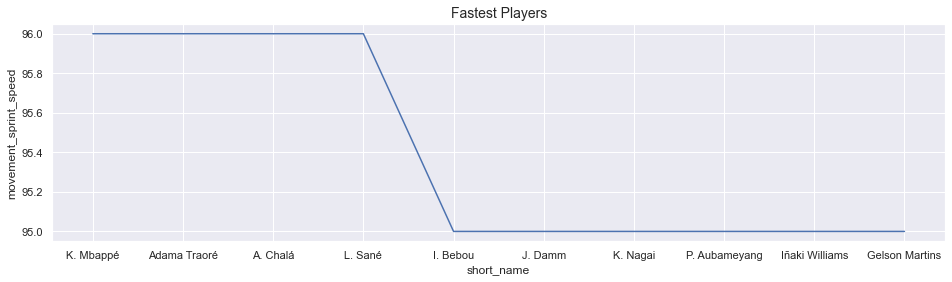

In [111]:
plt.figure(figsize=(16,4))
sns.lineplot(top_speed['short_name'], top_speed['movement_sprint_speed']).set_title("Fastest Players", fontsize=14);

__The movement_sprint_speed of 4 Players is same and equals to 96. They are K. Mbappe, Adama Traore, A. Chala, L. Sane.__

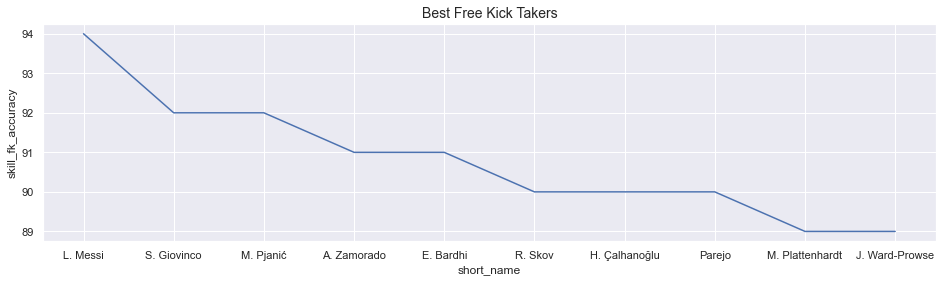

In [112]:
plt.figure(figsize=(16,4))
sns.lineplot(free_kick['short_name'], free_kick['skill_fk_accuracy']).set_title("Best Free Kick Takers", fontsize=14);

__L. Messi has the best skill_fk_accuracy of 94.__

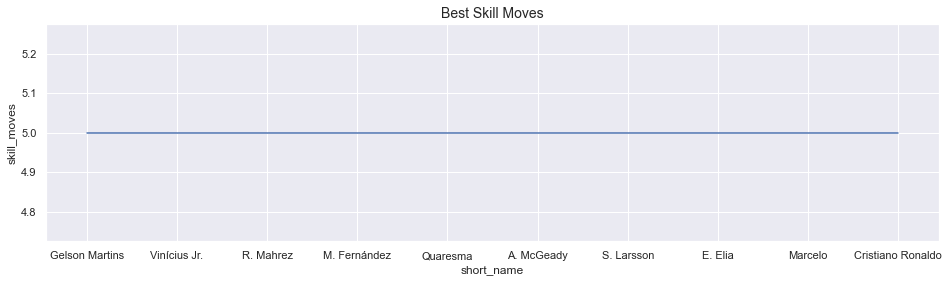

In [113]:
plt.figure(figsize=(16,4))
sns.lineplot(skill_moves['short_name'], skill_moves['skill_moves']).set_title("Best Skill Moves", fontsize=14);

__The skill_moves of all top 10 Players are same and equals to 5.__

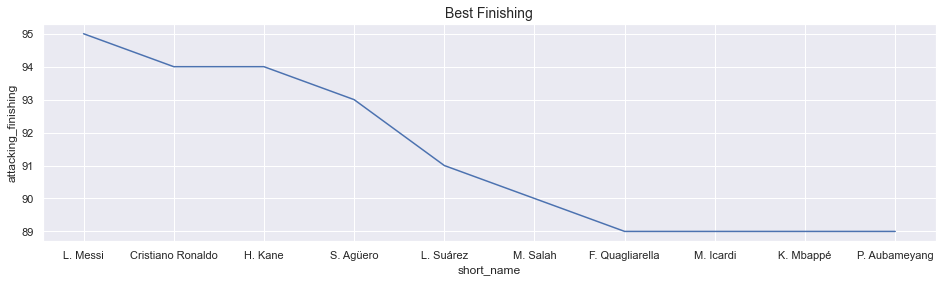

In [114]:
plt.figure(figsize=(16,4))
sns.lineplot(finishing['short_name'], finishing['attacking_finishing']).set_title("Best Finishing", fontsize=14);

__L. Messi has the highest attacking_finishing of 95.__

## 16. Work Rate

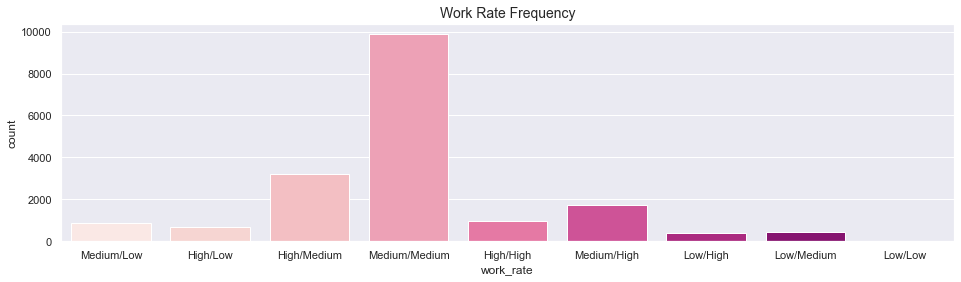

In [115]:
plt.figure(figsize=(16,4))
sns.countplot(df['work_rate'], palette="RdPu")
plt.title("Work Rate Frequency", fontsize=14);

In [116]:
rate = ['Medium/Low', 'High/Low', 'High/Medium', 'Medium/Medium', 'High/High', 'Medium/High', 'Low/High', 'Low/Medium', 'Low/Low']
data = df.query('work_rate in @rate')    
fig = px.pie(data, names='work_rate',
             color_discrete_sequence=px.colors.sequential.Plasma_r,
             title='Percentage of players in Various Work Rates')
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.update_layout(paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)',
                  font=dict(size=12, color='#000000'))
fig.show()

__Medium/Medium(M/M) player has the highest frequency. They tend to move forward to participate in the attack, and will also track back to defend, but not as frequently as a player with high work rates.__

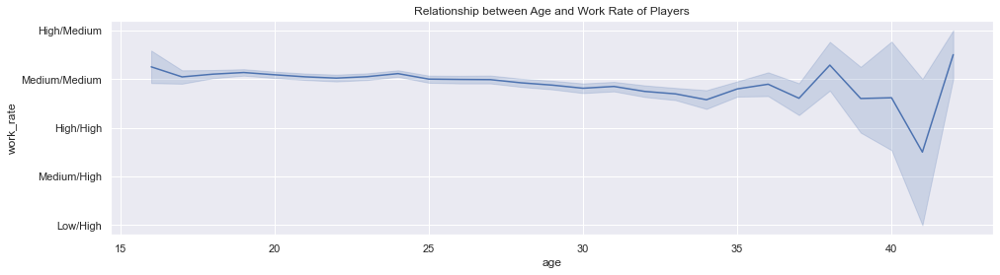

In [117]:
plt.figure(figsize=(16,4))
sns.lineplot(df['age'], df['work_rate'], palette="Paired").set_title("Relationship between Age and Work Rate of Players");

__The work rate remains Medium/Medium all the years till the player attains 40 years. After 40 years, the player's work rate suddenly changes to High/High.__

__***After analysing all the columns, we will try to draw few more insights***__

## 15. International Reputation

In [118]:
df_int = df[df["international_reputation"]==5].head(10)
print("The following Players have international reputation equals to 5:\n")
df_int[['short_name','age','nationality','club','overall', 'potential',"height_cm","weight_kg","international_reputation", "overall", "potential", "value_eur", "wage_eur", "pace",'preferred_foot',"skill_moves", "attacking_finishing", "skill_fk_accuracy", "movement_sprint_speed",'work_rate']].T

The following Players have international reputation equals to 5:



,0,1,2,19,31,96
short_name,L. Messi,Cristiano Ronaldo,Neymar Jr,L. Suárez,M. Neuer,Z. Ibrahimović
age,32,34,27,32,33,37
nationality,Argentina,Portugal,Brazil,Uruguay,Germany,Sweden
club,FC Barcelona,Juventus,Paris Saint-Germain,FC Barcelona,FC Bayern München,LA Galaxy
overall,94,93,92,89,88,85
potential,94,93,92,89,88,85
height_cm,170,187,175,182,193,195
weight_kg,72,83,68,86,92,95
international_reputation,5,5,5,5,5,5
overall,94,93,92,89,88,85


### Player with highest potential but lowest overall

In [119]:
print('Player with highest potential but lowest overall score')
potential_players = df.sort_values(by = ['overall','potential'], ascending = [True,False])
high_potential = potential_players[['short_name','age','nationality','club','potential','overall','value_eur','wage_eur']]
high_potential.head(1)

Player with highest potential but lowest overall score


,short_name,age,nationality,club,potential,overall,value_eur,wage_eur
18235,Tao Qianglong,17,China PR,Hebei China Fortune FC,73,48,60000,1000


### Best young players (with more than 90 potential)

In [120]:
sort_age = df[df['potential'] > 90].sort_values('age').head(3)
sort_age[['short_name','age','nationality','club','overall','potential','value_eur','wage_eur']]

,short_name,age,nationality,club,overall,potential,value_eur,wage_eur
568,Vinícius Jr.,18,Brazil,Real Madrid,79,92,22500000,60000
108,J. Sancho,19,England,Borussia Dortmund,84,92,44500000,61000
73,M. de Ligt,19,Netherlands,Juventus,85,93,50000000,76000


### Most promising teenagers

In [121]:
sort_age_2 = df[df['age'] <= 19].sort_values('potential', ascending=False).head(3)
sort_age_2[['short_name','age','nationality','club','overall','potential','value_eur','wage_eur']]

,short_name,age,nationality,club,overall,potential,value_eur,wage_eur
73,M. de Ligt,19,Netherlands,Juventus,85,93,50000000,76000
411,João Félix,19,Portugal,Atlético Madrid,80,93,28000000,38000
108,J. Sancho,19,England,Borussia Dortmund,84,92,44500000,61000


### Clubs with highest no of promising young players (< 21 years of age with potential > 85)

In [122]:
players = df[(df['age'] <= 21) & (df['potential'] >= 85)]
clubs = players.groupby('club').size().sort_values(ascending=False)
print(clubs.head())

club
RB Leipzig             9
Real Madrid            7
Manchester United      5
Bayer 04 Leverkusen    5
Chelsea                5
dtype: int64


### Cheapest promising young players

In [123]:
players = df[(df['age']<=21) & (df['potential']>=87)].sort_values('value_eur')
players[['short_name','age','nationality','club','overall','potential','value_eur','wage_eur']].head(3)

,short_name,age,nationality,club,overall,potential,value_eur,wage_eur
7690,M. Greenwood,17,England,Manchester United,67,87,1500000,6000
5658,A. Urzi,19,Argentina,Club Atlético Banfield,69,87,2300000,4000
4756,P. De la Vega,18,Argentina,Club Atlético Lanús,70,88,3700000,5000


## Task 2:- Explore football skills and cluster football players based on their attributes

### 1. KMeans:

In [124]:
player_attribute = df[["overall","pace", "shooting", "passing", "dribbling", "defending", "physic"]]

In [125]:
player_attribute.head(5)

,overall,pace,shooting,passing,dribbling,defending,physic
0,94,87.0,92.0,92.0,96.0,39.0,66.0
1,93,90.0,93.0,82.0,89.0,35.0,78.0
2,92,91.0,85.0,87.0,95.0,32.0,58.0
3,91,69.0,54.0,58.0,64.0,56.0,66.0
4,91,91.0,83.0,86.0,94.0,35.0,66.0


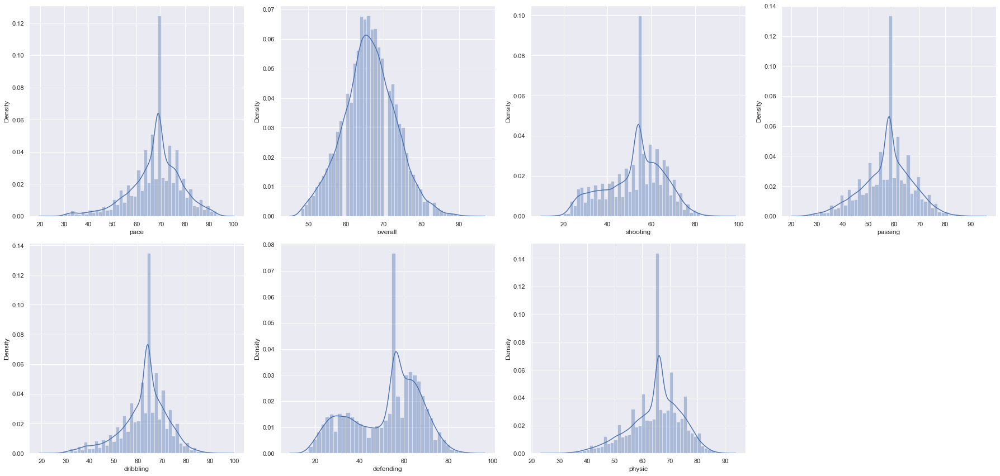

In [126]:
plt.figure(figsize = (25,12))
attr_cols = ["pace", "overall","shooting", "passing", "dribbling", "defending", "physic"]
plot_num = 1
for i in attr_cols:
    plt.subplot(2,4, plot_num)
    sns.distplot(player_attribute[i])
    plot_num += 1
plt.tight_layout()
plt.show()

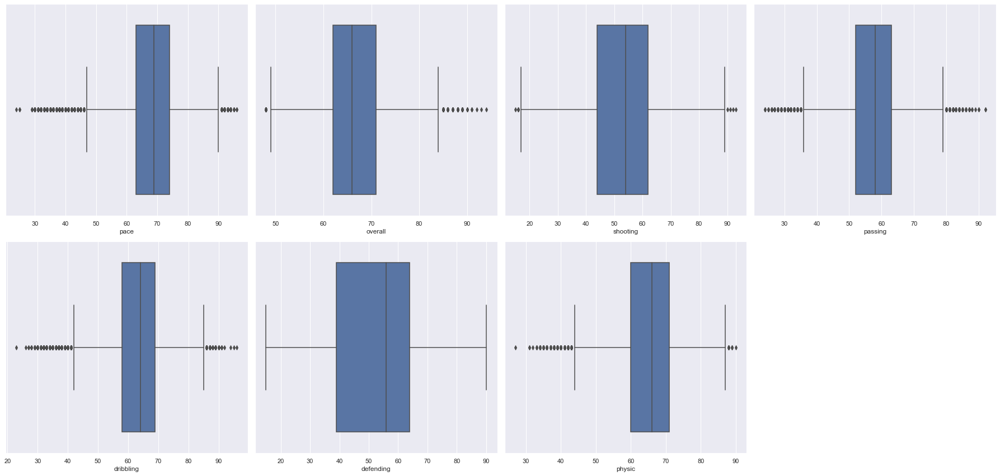

In [127]:
plt.figure(figsize = (25,12))
attr_cols = ["pace", "overall","shooting", "passing", "dribbling", "defending", "physic"]
plot_num = 1
for i in attr_cols:
    plt.subplot(2,4, plot_num)
    sns.boxplot(player_attribute[i])
    plot_num += 1
plt.tight_layout()
plt.show()

In [128]:
# Checking null values:
player_attribute.isnull().sum()

overall      0
pace         0
shooting     0
passing      0
dribbling    0
defending    0
physic       0
dtype: int64

In [129]:
# Percentage of null values:
for x in player_attribute.columns:
    print(f"{x} : {round(player_attribute[x].isnull().sum()/player_attribute.shape[0]*100, 2)}%")

overall : 0.0%
pace : 0.0%
shooting : 0.0%
passing : 0.0%
dribbling : 0.0%
defending : 0.0%
physic : 0.0%


__Imputing null values with the corresponding median values(Cause the above features having outliers and it is skewed):__

In [130]:
player_attribute.loc[player_attribute["pace"].isnull() == True, "pace"] = np.nanmedian(player_attribute["pace"])
player_attribute.loc[player_attribute["shooting"].isnull() == True, "shooting"] = np.nanmedian(player_attribute["shooting"])
player_attribute.loc[player_attribute["passing"].isnull() == True, "passing"] = np.nanmedian(player_attribute["passing"])
player_attribute.loc[player_attribute["dribbling"].isnull() == True, "dribbling"] = np.nanmedian(player_attribute["dribbling"])
player_attribute.loc[player_attribute["defending"].isnull() == True, "defending"] = np.nanmedian(player_attribute["defending"])
player_attribute.loc[player_attribute["physic"].isnull() == True, "physic"] = np.nanmedian(player_attribute["physic"])

In [131]:
player_attribute.isnull().sum()

overall      0
pace         0
shooting     0
passing      0
dribbling    0
defending    0
physic       0
dtype: int64

__Considering player's overall as 80 and above. Since an overall rating of 80 or above is considered to be very good, while a rating of 90 or above is considered to be exceptional. An overall rating of less than 80 can be considered average to above average, depending on the player's position and role in the team.__

In [132]:
player_attribute.head(3)

,overall,pace,shooting,passing,dribbling,defending,physic
0,94,87.0,92.0,92.0,96.0,39.0,66.0
1,93,90.0,93.0,82.0,89.0,35.0,78.0
2,92,91.0,85.0,87.0,95.0,32.0,58.0


In [133]:
## Player attributes greater equals 80
player_attribute_ge_80 = player_attribute.loc[player_attribute["overall"] >= 80]

In [134]:
player_attribute_ge_80.sample(5)

,overall,pace,shooting,passing,dribbling,defending,physic
453,80,66.0,46.0,74.0,70.0,81.0,72.0
242,82,69.0,54.0,58.0,64.0,56.0,66.0
28,88,69.0,54.0,58.0,64.0,56.0,66.0
89,85,75.0,82.0,73.0,72.0,35.0,84.0
98,85,63.0,85.0,71.0,80.0,31.0,71.0


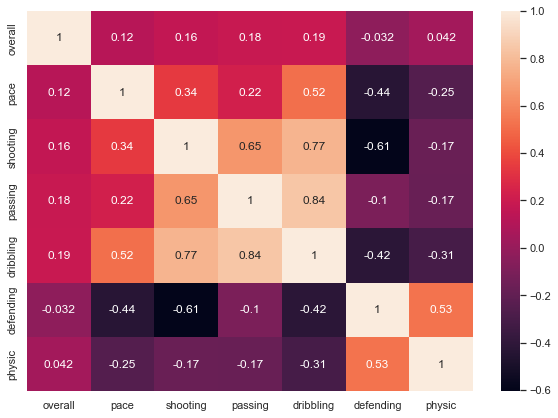

In [135]:
plt.figure(figsize = (10,7))
sns.heatmap(player_attribute_ge_80.corr(), annot = True)
plt.show()

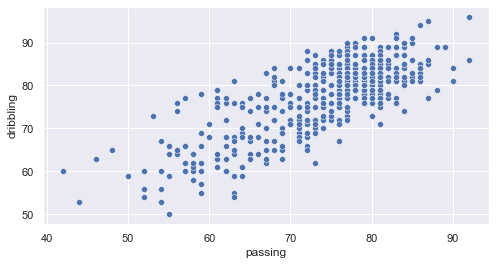

In [136]:
## Passing and dribbling

sns.scatterplot(player_attribute_ge_80["passing"], player_attribute_ge_80["dribbling"])
plt.show()

__Insights :__ The plot between __passing__ and __dribbling__ follows a "linear" kind of relationship. And from the heatmap we get a correlation of __0.84__ between them.

### Model creation

In [137]:
# Since it is an unsupervised learning, we need only the input variables.
# Taking only the player's attributes.
X = player_attribute_ge_80[["pace","shooting", "passing", "dribbling", "defending", "physic"]]

In [138]:
X.head(3)

,pace,shooting,passing,dribbling,defending,physic
0,87.0,92.0,92.0,96.0,39.0,66.0
1,90.0,93.0,82.0,89.0,35.0,78.0
2,91.0,85.0,87.0,95.0,32.0,58.0


__Applying PCA for reducing the dimension__

In [139]:
from sklearn.decomposition import PCA

In [140]:
pca = PCA()
pca.fit(X)

PCA()

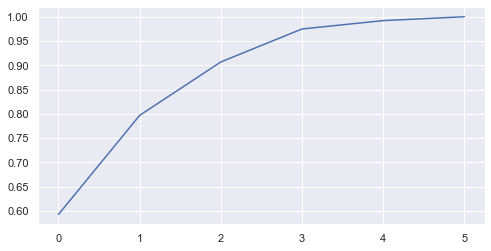

In [141]:
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.show()

In [142]:
pca_1 = PCA(n_components=2)
X_pca = pca_1.fit_transform(X)

In [143]:
X_pca = pd.DataFrame(X_pca, columns=["principle_component_1", "principle_component_2"])

In [144]:
from sklearn.cluster import KMeans

__Plotting Elbow plot, to get optimal number of clusters.__

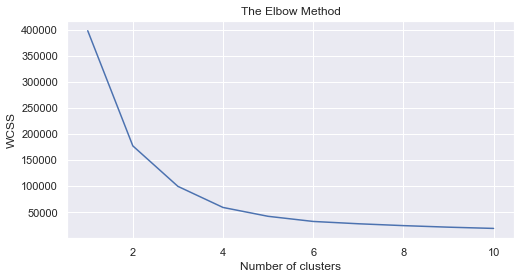

In [145]:
# Elbow method

wcss=[]
for i in range (1,11):
    kmeans=KMeans(n_clusters=i,random_state=10)
    kmeans.fit(X_pca)
    wcss.append(kmeans.inertia_)

plt.plot(range(1,11),wcss)
plt.title('The Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

In [146]:
kmeans = KMeans(n_clusters=4)
predicted_labels = kmeans.fit_predict(X_pca)

__Setting fontsize and fontweight for the xlabel, ylabel and title__

In [147]:
title_dict = {
    'fontsize': 25,
    'fontweight': "bold",
}

label_dict = {
    'fontsize': 15,
    'fontweight': "bold",
}

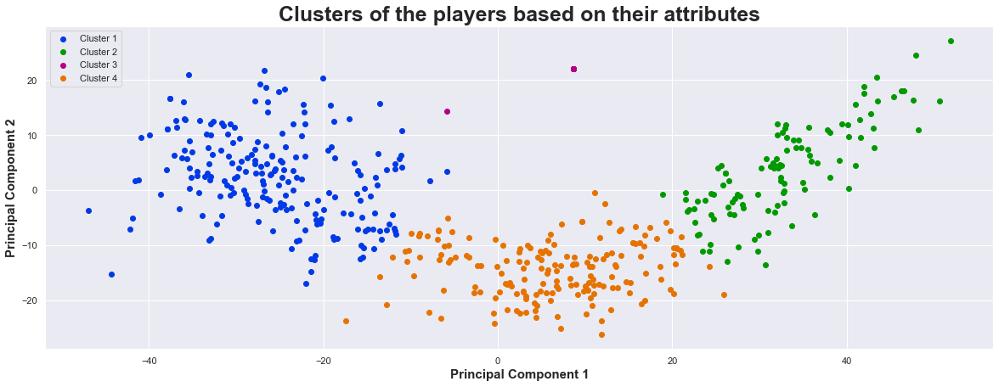

In [148]:
# Visualize the clusters in the original data
plt.figure(figsize = (20,7))
# plt.figure(figsize = (25,10))
plt.scatter(X_pca.loc[predicted_labels == 0, "principle_component_1"] , X_pca.loc[predicted_labels == 0, "principle_component_2"], color = '#0039e6', label='Cluster 1')
plt.scatter(X_pca.loc[predicted_labels == 1, "principle_component_1"] , X_pca.loc[predicted_labels == 1, "principle_component_2"], color = '#009900', label='Cluster 2')
plt.scatter(X_pca.loc[predicted_labels == 2, "principle_component_1"] , X_pca.loc[predicted_labels == 2, "principle_component_2"], color = '#b30086', label='Cluster 3')
plt.scatter(X_pca.loc[predicted_labels == 3, "principle_component_1"] , X_pca.loc[predicted_labels == 3, "principle_component_2"], color = '#e67300', label='Cluster 4')

# For plotting the corresponding centroids..------------------------------------------------------------------------------
# plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], marker='*', s=100, color='black', label = "Centroid")
#-------------------------------------------------------------------------------------------------------------------------

plt.xlabel("Principal Component 1", fontdict = label_dict)
plt.ylabel("Principal Component 2", fontdict = label_dict)
plt.title("Clusters of the players based on their attributes", fontdict=title_dict)
plt.legend(loc = "best")
plt.show()

In [149]:
from sklearn.metrics import *

In [150]:
score = silhouette_score(X_pca, predicted_labels)
print(f"Silhouette Score(KMeans):{score*100}%")

Silhouette Score(KMeans):59.918148696351935%


### 2. Hierarchical Clustering:

In [151]:
df_1 = df[['short_name',"overall","pace", "shooting", "passing", "dribbling", "defending", "physic"]]

df_1 = df_1[df.overall > 86] # extracting players with overall above 86

df_1 = df_1.fillna(df.median())

names = df_1.short_name.tolist() # saving names for later

df_1 = df_1.drop(['short_name'], axis = 1) # drop the short_name column
df_1.head()

,overall,pace,shooting,passing,dribbling,defending,physic
0,94,87.0,92.0,92.0,96.0,39.0,66.0
1,93,90.0,93.0,82.0,89.0,35.0,78.0
2,92,91.0,85.0,87.0,95.0,32.0,58.0
3,91,69.0,54.0,58.0,64.0,56.0,66.0
4,91,91.0,83.0,86.0,94.0,35.0,66.0


### Standardizing data

In [152]:
from sklearn import preprocessing

x = df_1.values # numpy array
scaler = preprocessing.MinMaxScaler()
x_scaled = scaler.fit_transform(x)
X_norm = pd.DataFrame(x_scaled)

__Hierarchical Clustering with Average Linkage__

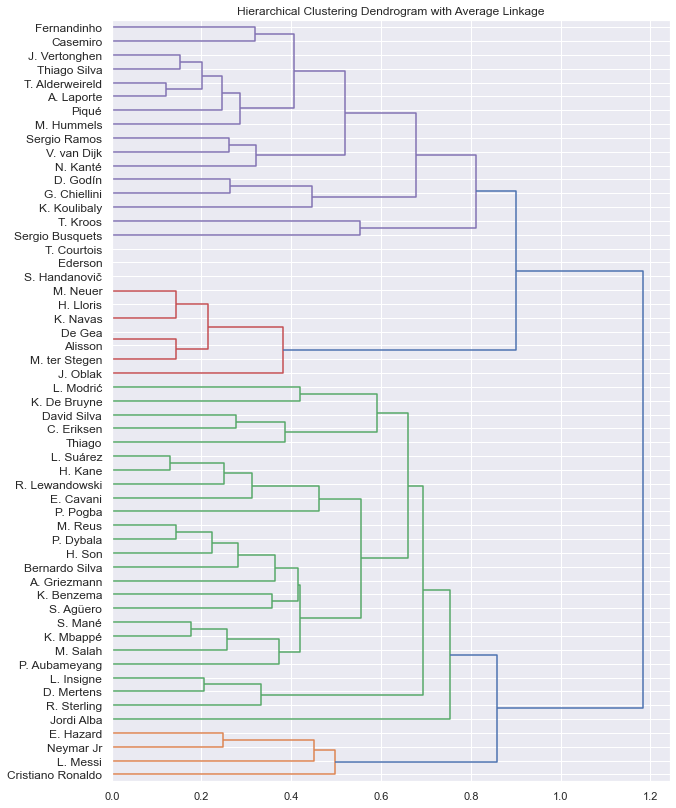

In [153]:
import matplotlib.pyplot as plt
import scipy.cluster.hierarchy as sch

# plot dendrogram using average linkage
plt.figure(figsize=(10,14))
plt.title('Hierarchical Clustering Dendrogram with Average Linkage')

dendrogram = sch.dendrogram(sch.linkage(X_norm, method="average"), labels= names, leaf_font_size = 12, orientation='right')

__Hierarchical Clustering with Single Linkage__

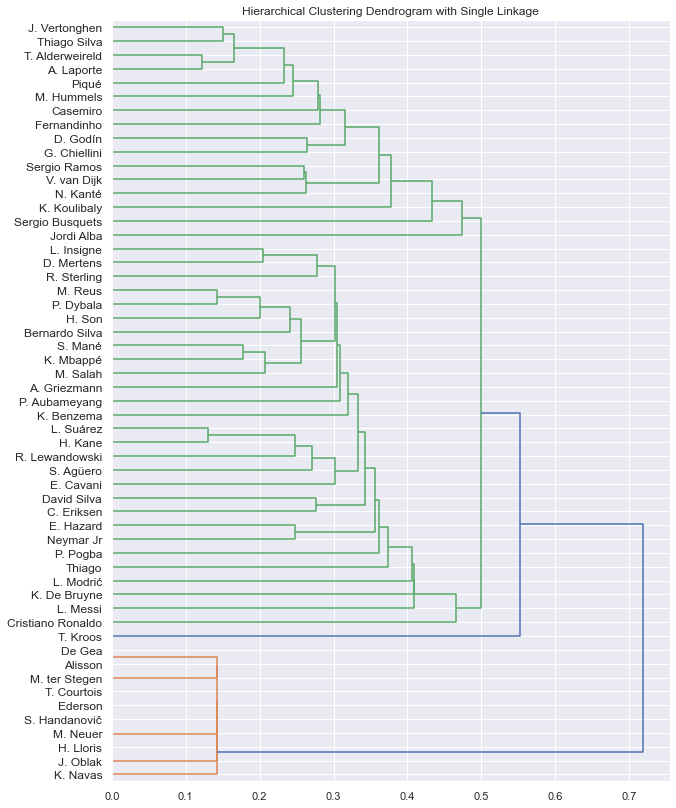

In [154]:
# plot dendrogram using single linkage
plt.figure(figsize=(10,14))
plt.title('Hierarchical Clustering Dendrogram with Single Linkage')

dendrogram = sch.dendrogram(sch.linkage(X_norm, method="single"), labels= names, leaf_font_size = 12, orientation='right')

__Hierarchical Clustering with Centroid Linkage__

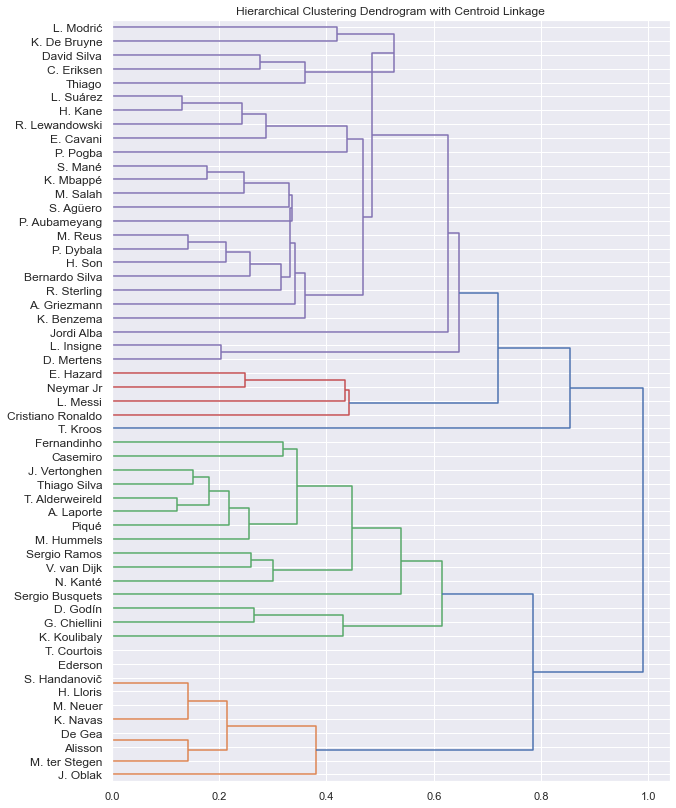

In [155]:
# plot dendrogram using centroid linkage
plt.figure(figsize=(10,14))
plt.title('Hierarchical Clustering Dendrogram with Centroid Linkage')

dendrogram = sch.dendrogram(sch.linkage(X_norm, method="centroid"), labels= names, leaf_font_size = 12, orientation='right')

__Hierarchical Clustering with Complete Linkage__

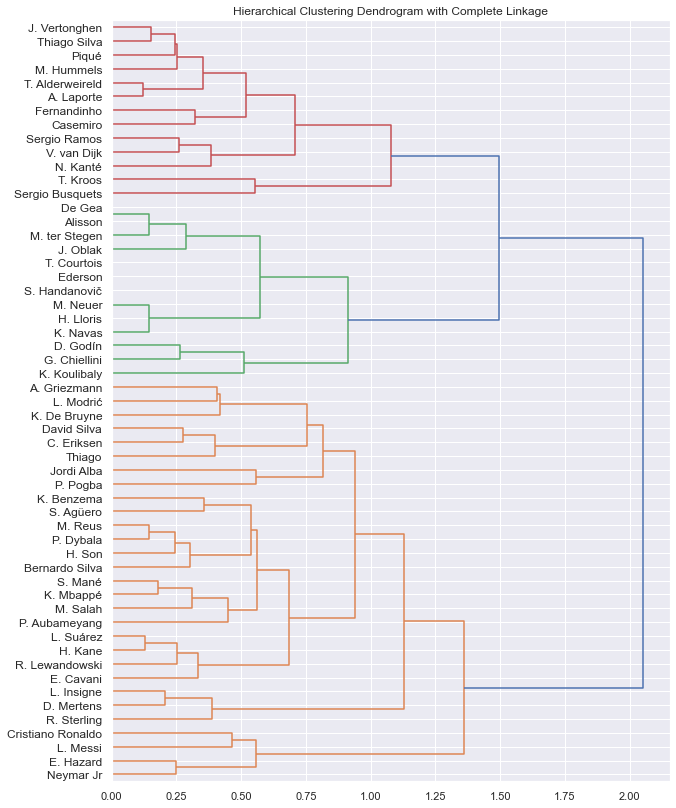

In [156]:
# plot dendrogram using complete linkage
plt.figure(figsize=(10,14))
plt.title('Hierarchical Clustering Dendrogram with Complete Linkage')

dendrogram = sch.dendrogram(sch.linkage(X_norm, method="complete"), labels= names, leaf_font_size = 12, orientation='right')

### 3. Agglomerative Clustering:

In [157]:
from sklearn.cluster import AgglomerativeClustering

In [158]:
model_agg = AgglomerativeClustering(n_clusters=4, affinity='euclidean',linkage='ward')
label_agg = model_agg.fit_predict(X_pca)

In [159]:
label_agg

array([0, 0, 0, 3, 0, 0, 3, 2, 0, 0, 0, 1, 0, 3, 3, 2, 1, 0, 2, 0, 0, 2,
       0, 0, 0, 3, 0, 0, 3, 1, 3, 3, 3, 0, 0, 1, 2, 0, 0, 0, 1, 0, 2, 0,
       2, 1, 0, 2, 0, 1, 1, 2, 0, 3, 0, 0, 1, 1, 2, 2, 3, 2, 0, 0, 2, 2,
       0, 1, 0, 2, 0, 0, 0, 1, 3, 2, 1, 1, 2, 2, 2, 2, 2, 1, 1, 0, 3, 3,
       3, 0, 1, 3, 2, 0, 2, 0, 0, 0, 0, 2, 0, 2, 2, 2, 0, 2, 0, 2, 0, 0,
       0, 3, 2, 2, 1, 2, 0, 2, 0, 0, 0, 0, 3, 0, 2, 3, 1, 0, 1, 2, 3, 3,
       2, 1, 2, 0, 1, 3, 0, 2, 0, 2, 2, 1, 2, 0, 2, 2, 2, 0, 0, 0, 0, 0,
       0, 0, 1, 2, 1, 0, 2, 0, 0, 0, 0, 1, 2, 3, 0, 0, 1, 0, 1, 2, 2, 0,
       0, 1, 0, 2, 0, 3, 0, 0, 3, 0, 0, 0, 0, 1, 0, 1, 0, 3, 2, 0, 3, 0,
       0, 2, 3, 3, 3, 1, 1, 0, 3, 0, 1, 0, 1, 3, 2, 2, 0, 2, 2, 0, 2, 0,
       0, 2, 2, 3, 1, 0, 2, 0, 0, 2, 0, 1, 2, 0, 0, 1, 0, 0, 0, 0, 0, 0,
       3, 0, 2, 2, 1, 0, 3, 2, 3, 3, 1, 0, 0, 0, 0, 3, 2, 0, 1, 0, 1, 1,
       3, 2, 2, 3, 3, 0, 0, 2, 3, 0, 2, 2, 0, 1, 1, 2, 1, 0, 0, 0, 0, 0,
       3, 2, 0, 0, 0, 2, 2, 3, 3, 0, 0, 1, 0, 1, 0,

In [160]:
X_pca["label_agg"] = label_agg

In [161]:
label_1 = X_pca.groupby("label_agg").mean()
label_1

,principle_component_1,principle_component_2
label_agg,,
0,-23.019305,0.390679
1,33.270775,4.250293
2,9.991277,-14.599064
3,8.626344,22.123897


In [162]:
print("The Silhouette Score of Agglomerative Clustering :", silhouette_score(X_pca,label_agg)*100)

The Silhouette Score of Agglomerative Clustering : 57.9709428641541


In [163]:
# Calculate the centroids of the clusters

centroids = np.zeros((3, 2))
for i in range(3):
    centroids[i] = np.mean(X_pca[["label_agg"]] == i, axis=0)
centroids

array([[0.42253521, 0.42253521],
       [0.1778169 , 0.1778169 ],
       [0.26584507, 0.26584507]])

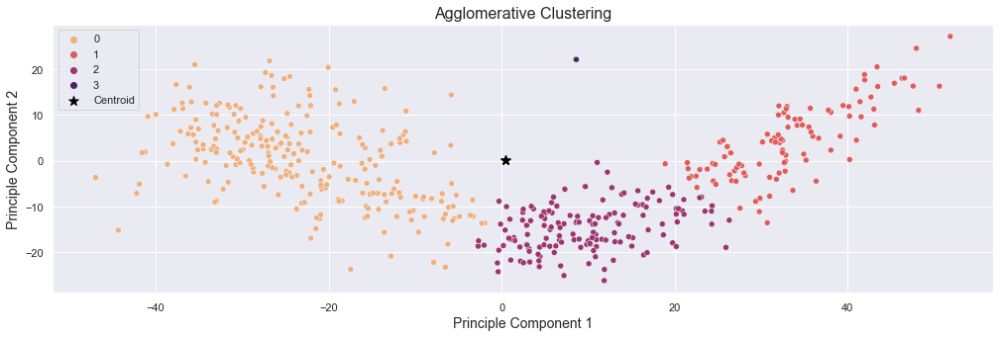

In [164]:
plt.figure(figsize=(17,5))
plt.title("Agglomerative Clustering", fontsize= 16)
plt.xlabel("Principle Component 1", fontsize= 14)
plt.ylabel("Principle Component 2", fontsize= 14)


# Plot the clusters and centroids
sns.scatterplot(x="principle_component_1", y="principle_component_2", hue= "label_agg", data =  X_pca, palette="flare")
plt.scatter(centroids[0], centroids[1], marker='*', s=100, c='black', label = "Centroid")
plt.legend(loc = "best")
plt.show()

In [165]:
X_pca.drop("label_agg", axis=1, inplace=True)

### 4. DBSCAN:

In [166]:
from sklearn.cluster import DBSCAN

In [167]:
dbscan = DBSCAN(eps=4,min_samples=15)

In [168]:
# Fitting the model

model_db = dbscan.fit(X_pca)

In [169]:
labels_db = model_db.labels_
print(labels_db)

[-1 -1 -1  0 -1 -1  0  2 -1 -1  1 -1  1  0  0  2 -1 -1 -1 -1  1 -1 -1 -1
 -1  0  1 -1  0 -1  0  0  0  1  1 -1  2 -1  1  1 -1  1 -1 -1  2 -1  1  2
 -1 -1 -1  2 -1  0 -1  1  2 -1  2  2  0  2  1 -1  2  2  1 -1 -1  2  1  1
  1  2  0  2  2 -1  2  2  2  2  2 -1  2 -1  0  0  0  1 -1  0  2 -1  2  1
  1  1  1  2 -1  2  2  2  1  2 -1  2  1  1  1  0  2  2  2  2  1  2  1 -1
  1  1  0  1  2  0  2  1  2  2  0  0  2  2  2  1 -1  0 -1  2  1  2 -1  2
  2  1  2  2  2  1  1  1  1  1  1  1 -1  2 -1 -1  2  1  1  1  1 -1  2  0
  1  1  2  1  2  2  2  1  1  2  1  2  1  0  1 -1  0  1  1  1 -1 -1  1  2
  1  0  2  1  0  1  1  2  0  0  0  2 -1  1  0 -1  2  1  2  0 -1  2 -1  2
  2  1  2  1  2  2 -1  0  2  1  2  1  1  2  1 -1  2  1 -1  2  1  1  1  1
  1 -1  0  1  2  2  2  1  0 -1  0  0 -1  1  1  1  1  0  2  1  2  1 -1  2
  0  2  2  0  0  1  1  2  0  1  2 -1  1  2  2  2  2  1  1  1  1  1  0  2
 -1  1  1  2  2  0  0  1 -1  2  1  2  1  1  1  2  1  1  1 -1  2  1 -1  1
  2  1  2 -1  1  2  1  1  1 -1 -1  1  0 -1  2  2  1

In [170]:
# Identifying the points which makes up our core points
sample_cores=np.zeros_like(labels_db,dtype=bool)
sample_cores[dbscan.core_sample_indices_]=True

print(sample_cores)

[False False False  True False False  True False False False False False
 False  True  True False False False False False  True False False False
 False  True  True False  True False  True  True  True False  True False
  True False  True False False False False False False False  True False
 False False False  True False  True False False False False  True False
  True False False False False  True False False False  True  True  True
  True False  True  True  True False False False  True False  True False
 False False  True  True  True False False  True  True False  True  True
  True  True  True False False False False  True  True  True False False
  True  True False  True  True False False  True  True  True  True False
  True  True  True False  True  True False False False  True  True  True
 False  True False False False  True False  True False False False False
  True  True  True  True  True False  True False  True False  True  True
 False  True False False  True False False  True Fa

In [171]:
#Calculating the number of clusters

n_clusters=len(set(labels_db))- (1 if -1 in labels_db else 0)
n_clusters

3

In [172]:
n_noise = list(labels_db).count(-1)
n_noise

115

In [173]:
X_pca["labels_db"] = labels_db

In [174]:
print("The Silhouette Score of DBSCAN :",silhouette_score(X_pca,labels_db)*100)

The Silhouette Score of DBSCAN : 38.03238572759892


In [175]:
# get unique cluster labels
unique_labels = set(labels_db)

# find centroid of each cluster
for label in unique_labels:
    if label == -1:
        # skip noise points
        continue
    # get all data points in this cluster
    cluster = X[labels_db == label]
    # calculate the centroid of the cluster
    centroid = np.mean(cluster, axis=0)
    print(f"Centroid of cluster {label}: {centroid}")

Centroid of cluster 0: pace         69.0
shooting     54.0
passing      58.0
dribbling    64.0
defending    56.0
physic       66.0
dtype: float64
Centroid of cluster 1: pace         80.034884
shooting     77.720930
passing      77.488372
dribbling    83.424419
defending    45.552326
physic       66.790698
dtype: float64
Centroid of cluster 2: pace         68.556098
shooting     62.439024
passing      74.141463
dribbling    74.546341
defending    78.521951
physic       76.853659
dtype: float64


__visualizing the clusters__

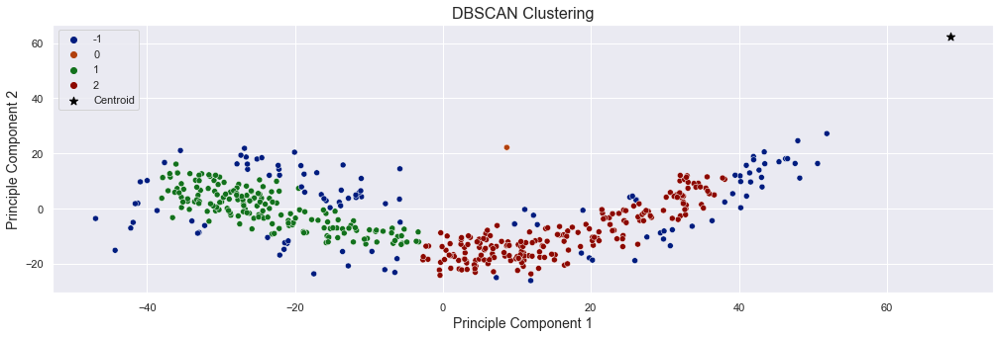

In [176]:
plt.figure(figsize=(17,5))
plt.title("DBSCAN Clustering", fontsize= 16)
plt.xlabel("Principle Component 1", fontsize= 14)
plt.ylabel("Principle Component 2", fontsize= 14)

sns.scatterplot( x  = "principle_component_1", y= "principle_component_2", hue= "labels_db", data =  X_pca, palette="dark");
plt.scatter(centroid[0], centroid[1], centroid[2], marker = "*",  c= 'black', label = "Centroid")
plt.legend(loc = "best")
plt.show()

In [177]:
X_pca.drop("labels_db", axis =1, inplace= True)

### Task 3(A):- Prepare a rank ordered list of top 10 countries with most players. Which countries are producing the most footballers that play at this level?

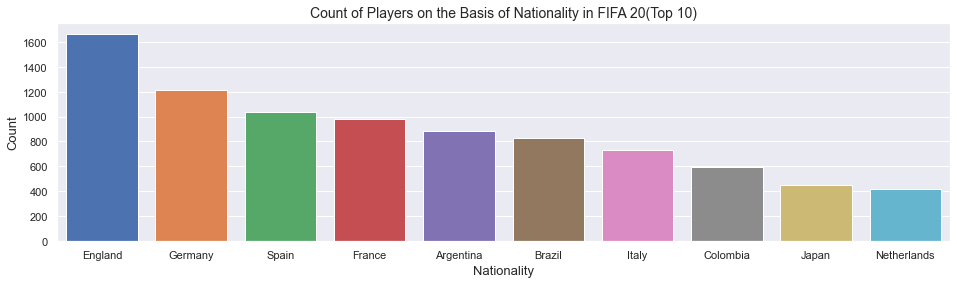

In [178]:
plt.figure(figsize= (16, 4))
ax = sns.countplot(x='nationality', data=df, order=df.nationality.value_counts().iloc[:10].index, saturation=1.1)
ax.set_title(label='Count of Players on the Basis of Nationality in FIFA 20(Top 10)', fontsize=14)
ax.set_xlabel(xlabel='Nationality', fontsize=13)
ax.set_ylabel(ylabel='Count', fontsize=13);

__Here, "ENGLAND" is leading in producing the most number of players. Whereas, "Netherlands" has the least number of players in the order of top 10 rankings.__

### Task 3(B) Age Effect On Overall Rate

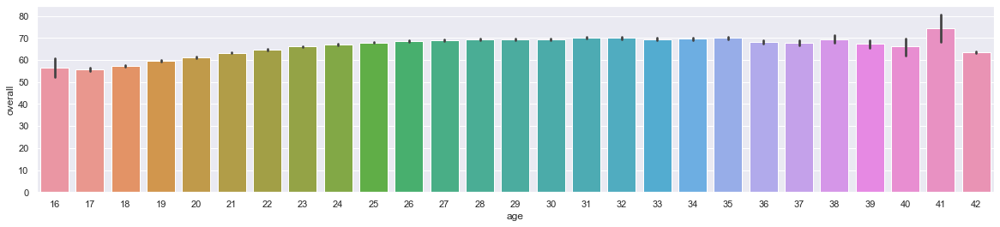

In [179]:
plt.figure(figsize=(20,4))
sns.barplot(df['age'], df['overall']);

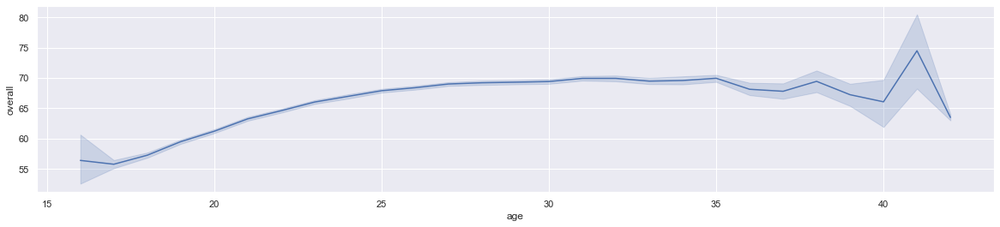

In [180]:
plt.figure(figsize=(20,4))
sns.lineplot(df['age'], df['overall']);

__From this plot we can conclude that the overall rating of the players keeps on increasing gradually till they attain the age of 25. From 25 to 35, there is no improvement in the performane. As soon as the player reaches 35, their rating follows a pattern of marginal declining and inclining till it reaches 40. At the age of 40, the overall rating increases abruptly and then after few years it follows a continous downfall. So, we can say that the player stops improving between the age of 28 to 40.__ 

### Tasks 3(C): Which type of offensive players tends to get paid the most: the striker, the right-winger, or the left-winger? 

In [181]:
df_new = df[["team_position", "wage_eur"]]

In [182]:
pos = df_new.loc[(df_new["team_position"] == "ST") | (df_new["team_position"] == "RW") | (df_new["team_position"] == "LW")]

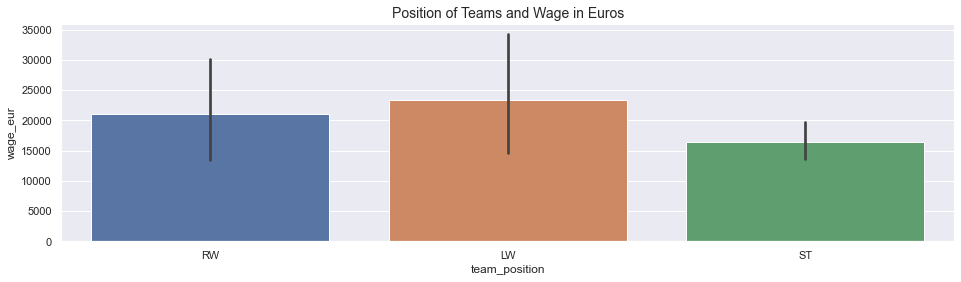

In [183]:
plt.figure(figsize = (16, 4))
sns.barplot(x=pos.team_position, y=pos.wage_eur)
plt.title("Position of Teams and Wage in Euros", fontsize=14);

__Left Winger(LW) players receive the highest salary among Right Winger, Left Winger and Stricker__

**Findings** 

* There are 162 different nationalities amoung the players.
* There are 698 different clubs in FIFA 20.
* FC Barcelona has the highest number of players with the highest reputation and they are L. Messi and L. Suarez.
* Most clubs has 25 to 33 players. The maximum number of playes a club has 33 and there are 49 clubs which has 33 players.
* M. De legit has the highest overall score being under 20 years old. He is from Netherlands, 19 years old and club he plays for is Juventus.His overall score is 85. 
* M. Al Shalhoub has the oldest contract. He is 38 years old, nationality Saudi Arabia and club he playes for is Al Hilal.
* Tao Qianlong from Hebei China Fortune FC has the highest potential and lowest overall score.
* England has the highest number of players. 1667 players are from England. 

* The top 5 most rated national teams come from France, Spain, Argentina, Brazil, Belgium.
* FC Barcelona, Liverpool and Real Madrid are the top 3 Clubs containing the most of the Players with the best Overall Ratings. Whereas, Manchester City, Liverpool and FC Barcelona are the top 3 clubs producing the most high-Valued players.
* Covid-19 can affect countries that has atleast 1 football club. The countries that will be most affected are  India, Brazil, Russia, France, Spain. 
* Two of renowned players, Messi and Ronaldo differ a significant amount valueing their net worth. However salary doesn't differ that much. 
* L. Messi emerges out to be the best player with an overall : 94, potential : 94, Wage : 565k Euros and Value : 95.5M Euros and best attacker.
* Overall score increases as potential increases. Potential decreases as age and BMI increases. However, overall score increases as age and bmi increases.
* The number of players that plays in LW position are 981. Most players play at CB positon. RWB is the lowest among all the postions. 

**Recommendation**

* The players who are under 20 years old and have high overall score can be trained further to achieve more in future. 
* Some for the players who have high potential but have low overall scores. Clubs can focus on these players and train them to give the best outcome. 
* More players play in centre back so the new players can be trained to play in other position. Offensive positions are not that popular amoung players. 
* Further investigation could be done to see which club is the best since FC Barcelona has two of best players with highest international reputation. 
* Also, it is interesting to find that overall score increases with age and increase in BMI but potential decreases whereas overall score and potential are positive correlated. Further investigation could be done on that topic. 
* Also more reseach could be done on how covid 19 has affected different clubs and are those club digitizing to broadcast their games. 

__Conclusion__

FIFA started it's journey in 1930 and it has been almost a century that it is active. More and more people are playing the video game. In future, we might be able to use virtual reality to play the game. The video game has now become more realistic and doing this kind of analysis can provide insights of a real game as well.

__For clustering tasks, KMeans is performing well than "Hierarchical", "Agglomerative" and "DBSCAN" clustering techniques__